# Model training

In [1]:
%load_ext autoreload
%autoreload 2
import io
import os
import socket

import torch as th
import torch.distributed as dist
import argparse

from Squidiff import dist_util,logger

from Squidiff.scrna_datasets import load_diff_data,prepared_data
from Squidiff.resample import create_named_schedule_sampler
from Squidiff.script_util import (
    model_and_diffusion_defaults,
    create_model_and_diffusion,
    args_to_dict,
    add_dict_to_argparser,
)

from Squidiff.train_util import TrainLoop

GPUS_PER_NODE = 1  # Set this to the actual number of GPUs per node


def get_default_args():
    defaults = dict(
        data_dir="",
        schedule_sampler="uniform",
        lr=1e-4,
        weight_decay=0.0,
        lr_anneal_steps=0,
        batch_size=64,
        microbatch=-1,  # -1 disables microbatches
        ema_rate="0.9999",  # comma-separated list of EMA values
        log_interval=5000,
        save_interval=10000,
        resume_checkpoint="",
        use_fp16=False,
        fp16_scale_growth=1e-3,
        use_encoder=False
    )
    defaults.update(model_and_diffusion_defaults())
    return defaults



def setup_dist():
    """
    Setup a distributed process group.
    """
    if dist.is_initialized():
        return
    backend = "gloo" if not th.cuda.is_available() else "nccl"
    dist.init_process_group(backend=backend, init_method="env://")


def dev():
    """
    Get the device to use for torch.distributed.
    """
    if th.cuda.is_available():
        return th.device(f"cuda")
    return th.device("cpu")


def load_state_dict(path, **kwargs):
    """
    Load a PyTorch file without redundant fetches across ranks.
    """
    chunk_size = 2 ** 30  # Size limit for data chunks
    if dist.get_rank() == 0:
        with open(path, "rb") as f:
            data = f.read()
        num_chunks = len(data) // chunk_size
        if len(data) % chunk_size:
            num_chunks += 1
        dist.broadcast(th.tensor(num_chunks), 0)
        for i in range(0, len(data), chunk_size):
            dist.broadcast(th.tensor(data[i: i + chunk_size]), 0)
    else:
        num_chunks = dist.broadcast(th.tensor(0), 0).item()
        data = bytes()
        for _ in range(num_chunks):
            chunk = th.zeros(chunk_size, dtype=th.uint8)
            dist.broadcast(chunk, 0)
            data += bytes(chunk.numpy())

    return th.load(io.BytesIO(data), **kwargs)


def sync_params(params):
    """
    Synchronize a sequence of Tensors across ranks from rank 0.
    """
    for p in params:
        with th.no_grad():
            dist.broadcast(p, 0)


def _find_free_port():
    """
    Find a free port for distributed training setup.
    """
    try:
        s = socket.socket(socket.AF_INET, socket.SOCK_STREAM)
        s.bind(("", 0))
        s.setsockopt(socket.SOL_SOCKET, socket.SO_REUSEADDR, 1)
        return s.getsockname()[1]
    finally:
        s.close()


def run_training(args):

    logger.configure(dir='/hpc/mydata/siyu.he/Siyu_projects/squidward_study/logger_file')

    logger.log("creating model and diffusion...")
    model, diffusion = create_model_and_diffusion(
        **args_to_dict(args, model_and_diffusion_defaults().keys())
    )
    model.to(dev())
    schedule_sampler = create_named_schedule_sampler(args['schedule_sampler'], diffusion)

    logger.log("creating data loader...")
    data = prepared_data(
        data_dir=args['data_dir'],
        fn = load_diff_data
    )

    logger.log("training...")
    train_ = TrainLoop(
        model=model,
        diffusion=diffusion,
        data=data,
        batch_size=args['batch_size'],
        microbatch=args['microbatch'],
        lr=args['lr'],
        ema_rate=args['ema_rate'],
        log_interval=args['log_interval'],
        save_interval=args['save_interval'],
        resume_checkpoint=args['resume_checkpoint'],
        use_fp16=args['use_fp16'],
        fp16_scale_growth=args['fp16_scale_growth'],
        schedule_sampler=schedule_sampler,
        weight_decay=args['weight_decay'],
        lr_anneal_steps=args['lr_anneal_steps'],
    )
    train_.run_loop()
    return train_.loss_list


args = get_default_args()
args.update({
    'data_dir': '/hpc/mydata/siyu.he/Siyu_projects/squidward_study/raw_datasets/differentiation/',
    'schedule_sampler': 'uniform',
    'lr': 1e-4,
    'weight_decay': 0.0,
    'lr_anneal_steps': 1e5,
    'batch_size': 128,
    'microbatch': -1,
    'ema_rate': '0.9999',
    'log_interval': 5000,
    'save_interval': 1e4,#1e4,
    'resume_checkpoint': '',
    'use_fp16': False,
    'fp16_scale_growth': 1e-3,
    'gene_size': 203, 
    'output_dim':203,
    'num_layers':3,
    'class_cond': False,  
    'use_encoder': True,
    'diffusion_steps': 1000,
})

In [2]:
losses = run_training(args)

Logging to /hpc/mydata/siyu.he/Siyu_projects/squidward_study/logger_file
creating model and diffusion...
steps 1000
creating data loader...


/hpc/mydata/siyu.he/anaconda/2023.03/x86_64/envs/scvi_v1_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/mydata/siyu.he/anaconda/2023.03/x86_64/envs/scvi_v1_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/mydata/siyu.he/anaconda/2023.03/x86_64/envs/scvi_v1_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/mydata/siyu.he/anaconda/2023.03/x86_64/envs/scvi_v1_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_

training...


/hpc/mydata/siyu.he/anaconda/2023.03/x86_64/envs/scvi_v1_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


-------------------------
| grad_norm  | 1.82     |
| loss       | 1.12     |
| loss_q0    | 1.11     |
| loss_q1    | 1.08     |
| loss_q2    | 1.19     |
| loss_q3    | 1.11     |
| mse        | 1.12     |
| mse_q0     | 1.11     |
| mse_q1     | 1.08     |
| mse_q2     | 1.19     |
| mse_q3     | 1.11     |
| param_norm | 172      |
| samples    | 128      |
| step       | 0        |
-------------------------
saving model 0...
saving model 0.9999...
-------------------------
| grad_norm  | 0.804    |
| loss       | 0.243    |
| loss_q0    | 0.615    |
| loss_q1    | 0.209    |
| loss_q2    | 0.0846   |
| loss_q3    | 0.0657   |
| mse        | 0.243    |
| mse_q0     | 0.615    |
| mse_q1     | 0.209    |
| mse_q2     | 0.0846   |
| mse_q3     | 0.0657   |
| param_norm | 176      |
| samples    | 1.28e+06 |
| step       | 1e+04    |
-------------------------
saving model 0...
saving model 0.9999...
-------------------------
| grad_norm  | 0.809    |
| loss       | 0.207    |
| loss_q

# traning loss

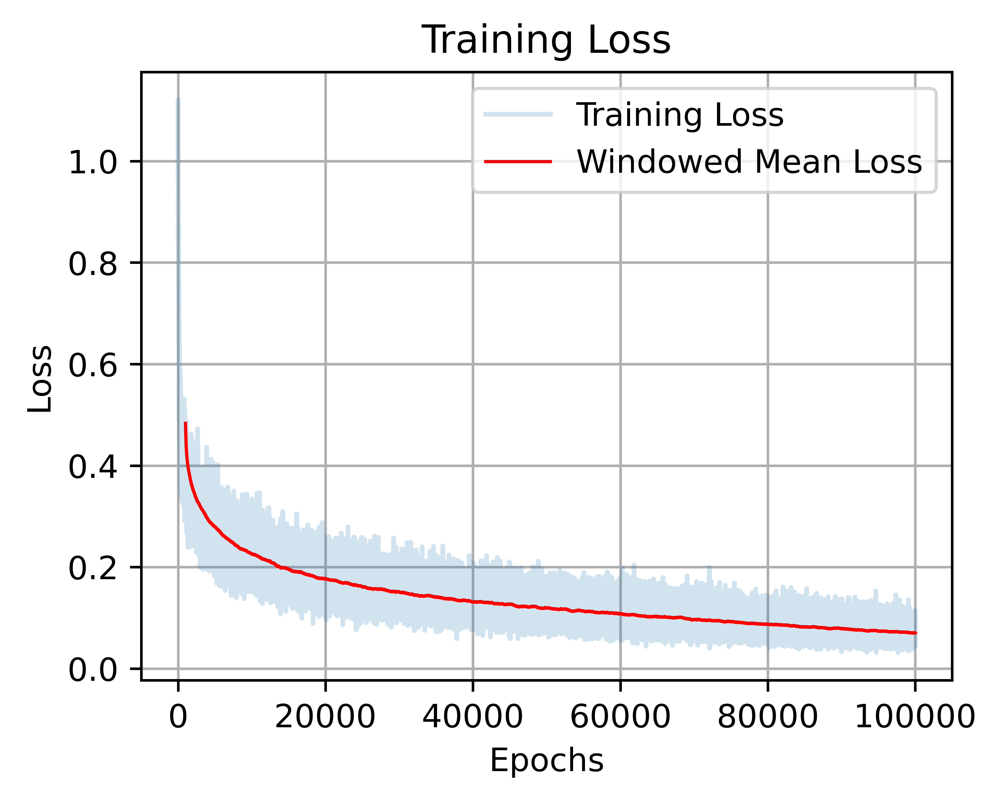

In [3]:
import matplotlib.pyplot as plt
import numpy as np

# Convert losses to a numpy array
losses_np = np.array([i.detach().cpu().numpy() for i in losses])

# Define the window size for the moving average
window_size = 1000  # You can adjust this value based on your preference

# Calculate the moving average (mean of the windowed losses)
windowed_mean_loss = np.convolve(losses_np, np.ones(window_size) / window_size, mode='valid')

# Adjust the x-axis values for the windowed mean loss
x_vals = np.linspace(0, 100000, len(losses_np))
windowed_x_vals = x_vals[window_size - 1:]  # Adjust to match the length of the windowed_mean_loss

# Plotting
plt.figure(figsize=(4.5, 3.4), dpi=800)
plt.plot(x_vals, losses_np, label='Training Loss', alpha=0.2)
plt.plot(windowed_x_vals, windowed_mean_loss, label='Windowed Mean Loss', color='r', linewidth=1)

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()
plt.grid(True)
plt.show()


# plot zsem and xT on test data

In [4]:
from scipy.stats import gaussian_kde
def display_reconst(df_true,
                    df_pred,
                    density=False,
                    den_all = False,
                    marker_genes=None,
                    sample_rate=0.1,
                    size=(2,2),
                    spot_size=5,
                    title=None,
                    x_label='',
                    y_label='',
                    ):
    """
    Scatter plot - raw gexp vs. reconstructed gexp
    """
    assert 0 < sample_rate <= 1, \
        "Invalid downsampling rate for reconstruct scatter plot: {}".format(sample_rate)

    if marker_genes is not None:
        marker_genes = set(marker_genes)

    df_true_sample = df_true.sample(frac=sample_rate, random_state=0)
    df_pred_sample = df_pred.loc[df_true_sample.index]

    plt.rcParams["figure.figsize"] = size
    plt.figure(dpi=800)
    ax = plt.gca()

    xx = df_true_sample.T.to_numpy().flatten()
    yy = df_pred_sample.T.to_numpy().flatten()

    if density and not den_all:
        for gene in df_true_sample.columns:
            try:
                gene_true = df_true_sample[gene].values
                gene_pred = df_pred_sample[gene].values
                gexp_stacked = np.vstack([df_true_sample[gene].values, df_pred_sample[gene].values])

                z = gaussian_kde(gexp_stacked)(gexp_stacked)
                ax.scatter(gene_true, gene_pred, c=z,vmin=0,cmap='Spectral_r',
                           s=spot_size, alpha=0.6)
            except np.linalg.LinAlgError as e:
                pass

    elif marker_genes is not None:
        color_dict = {True: 'red', False: 'green'}
        gene_colors = np.vectorize(
            lambda x: color_dict[x in marker_genes]
        )(df_true_sample.columns)
        colors = np.repeat(gene_colors, df_true_sample.shape[0])

        ax.scatter(xx, yy, c=colors, s=spot_size, alpha=0.5)

    elif density and den_all:
        gene_true = df_true_sample.values.flatten()
        gene_pred = df_pred_sample.values.flatten()
        gexp_stacked = np.vstack([df_true_sample.values.flatten(), df_pred_sample.values.flatten()])
        z = gaussian_kde(gexp_stacked)(gexp_stacked)
        ax.scatter(gene_true, gene_pred, c=z,vmin=0,cmap='Spectral_r',
                           s=spot_size, alpha=0.99)
    else:
        ax.scatter(xx, yy, s=spot_size, alpha=0.99)
    

    
    #ax.set_aspect('equal',adjustable='box')
    ax.set_xlim(-0.5, 14)
    ax.set_ylim(-0.5, 14)
    ax.axis('equal')
    
    plt.suptitle(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    #ax.set_xlim(-0.5, 12)
    #ax.set_ylim(-0.5, 12)

    plt.show()
    

In [5]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
import argparse
import os

import numpy as np
import torch as th
import torch.distributed as dist

from Squidiff import dist_util, logger
from Squidiff.script_util import (
    NUM_CLASSES,
    model_and_diffusion_defaults,
    create_model_and_diffusion,
    add_dict_to_argparser,
    args_to_dict,
)


def create_argparser():
    defaults = dict(
        clip_denoised=False,
        num_samples=2400,
        batch_size=16,
        use_ddim=False,
        model_path="model.pt",
    )
    defaults.update(model_and_diffusion_defaults())

    return defaults


In [9]:

args = create_argparser()
args.update({
    'data_dir': '/hpc/mydata/siyu.he/Siyu_projects/squidward_study/raw_datasets/differentiation/',
    'schedule_sampler': 'uniform',
    'lr': 1e-4,
    'weight_decay': 0.0,
    'lr_anneal_steps': 2400,
    'batch_size': 16,
    'microbatch': -1,
    'ema_rate': '0.9999',
    'log_interval': 50,
    'save_interval': 1000,
    'resume_checkpoint': '',
    'use_fp16': False,
    'fp16_scale_growth': 1e-3,
    'gene_size': 203, 
    'output_dim':203,
    'num_layers':3,
    'class_cond': False,  
    'use_ddim':True,
    'use_encoder':True,
    'diffusion_steps': 1000,
    #'model_path':'saved_model/diff01_model.pt'
})
#dist_util.setup_dist()

logger.configure(dir='logger_file')
logger.log("creating model and diffusion...")

model, diffusion = create_model_and_diffusion(
        **args_to_dict(args, model_and_diffusion_defaults().keys())
    )

model.load_state_dict(
    dist_util.load_state_dict(args['model_path'])
)
model.to(dist_util.dev())
if args['use_fp16']:
    model.convert_to_fp16()
model.eval()


Logging to logger_file
creating model and diffusion...
steps 1000


MLPModel(
  (encoder): EncoderMLPModel(
    (fc1): Linear(in_features=203, out_features=2048, bias=True)
    (bn1): BatchNorm1d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (bn2): BatchNorm1d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc2): Linear(in_features=2048, out_features=2048, bias=True)
    (fc3): Linear(in_features=2048, out_features=60, bias=True)
    (label_embed): Linear(in_features=1, out_features=2048, bias=True)
  )
  (time_embed): Sequential(
    (0): Linear(in_features=2048, out_features=2048, bias=True)
    (1): SiLU()
    (2): Linear(in_features=2048, out_features=2048, bias=True)
  )
  (mlp_blocks): TimestepEmbedSequential(
    (0): MLPBlock(
      (fc1): Linear(in_features=2048, out_features=2048, bias=True)
      (fc2): Linear(in_features=2048, out_features=2048, bias=True)
      (layer_norm1): LayerNorm((2048,), eps=1e-05, elementwise_affine=True)
      (layer_norm2): LayerNorm((2048,), eps=1e-05, eleme

In [10]:
data = load_diff_data(data_dir=args['data_dir'])

/hpc/mydata/siyu.he/anaconda/2023.03/x86_64/envs/scvi_v1_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/mydata/siyu.he/anaconda/2023.03/x86_64/envs/scvi_v1_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/mydata/siyu.he/anaconda/2023.03/x86_64/envs/scvi_v1_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/mydata/siyu.he/anaconda/2023.03/x86_64/envs/scvi_v1_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_

In [11]:
train_adata = data[0]
train_adata.obs = train_adata.obs[['day']]

test_adata = data[2]
test_adata.obs = test_adata.obs[['day']]

val_adata = data[1]
val_adata.obs  = val_adata.obs[['day']]


In [12]:
import scanpy as sc
combined_adata = sc.concat([train_adata])
sc.tl.pca(combined_adata, svd_solver='arpack')
sc.pp.neighbors(combined_adata, n_neighbors=30, n_pcs=50)
sc.tl.umap(combined_adata,min_dist=0.4)


/hpc/mydata/siyu.he/anaconda/2023.03/x86_64/envs/scvi_v1_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [13]:
def stochastic_encode(
    model, x, t, model_kwargs):
    """
    ddim reverse sample
    """
    sample = x
    sample_t = []
    xstart_t = []
    T = []
    indices = list(range(t))

    for i in indices:
        timestep = torch.full((x.shape[0],), i, device='cuda').long()
        with torch.no_grad():
            out = diffusion.ddim_reverse_sample(model, 
                                                sample, 
                                                timestep, 
                                                model_kwargs=model_kwargs)
            sample = out['sample']
            sample_t.append(sample)
            xstart_t.append(out['pred_xstart'])
            T.append(timestep)

    return {
    'sample': sample,
    'sample_t': sample_t,
    'xstart_t': xstart_t,
    'T': T,
}


In [54]:
import torch
z_sem = model.encoder(torch.tensor(data[0].X).to('cuda'),
                      #label = torch.tensor(data[2].obs.values, dtype = torch.float32).to('cuda'),
                     )

model_kwargs = {'x_start':torch.tensor(data[0].X, dtype = torch.float32).to('cuda'),
                'z_mod':z_sem,
                #'cond':torch.tensor(data[2].obs.values, dtype = torch.float32).to('cuda'),
               }

x_T = stochastic_encode(model,
                  x = torch.tensor(data[0].X, dtype = torch.float32).to('cuda'),
                  t = 999,
                  model_kwargs=model_kwargs
                 )['sample']


label = data[0].obs.values[:,0]

In [61]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def plot_embed(x_, n_components=2, size=5, random_state=42,alpha=1):
    """
    Function to plot PCA embedding of the data with color-coded labels.

    Parameters:
    - x_: Input data
    - label: Labels for coloring the embedding points
    - n_components: Number of embedding dimensions (default is 2)
    - size: Marker size in the scatter plot
    - random_state: Seed for reproducibility
    """
    
    # PCA dimensionality reduction
    pca = PCA(n_components=n_components, random_state=random_state)
    embedding = pca.fit_transform(x_.detach().cpu())
    #reducer = umap.UMAP(n_neighbors=30, min_dist=0.2, n_components=n_components,)
    #embedding = reducer.fit_transform(x_.detach().cpu())
    
    # Plotting the embedding
    plt.figure(figsize=(3, 3), dpi=800)
    colorlist = ['#3145a8', '#fa2616']  # Colors for different cell types
    
    # Plot each label category
    plt.scatter(embedding[label == 0, 0], embedding[label == 0, 1], c=colorlist[0], s=size, alpha=alpha)
    plt.scatter(embedding[label == 3, 0], embedding[label == 3, 1], c=colorlist[1], s=size, alpha=alpha)

    plt.axis('off')
    plt.show()


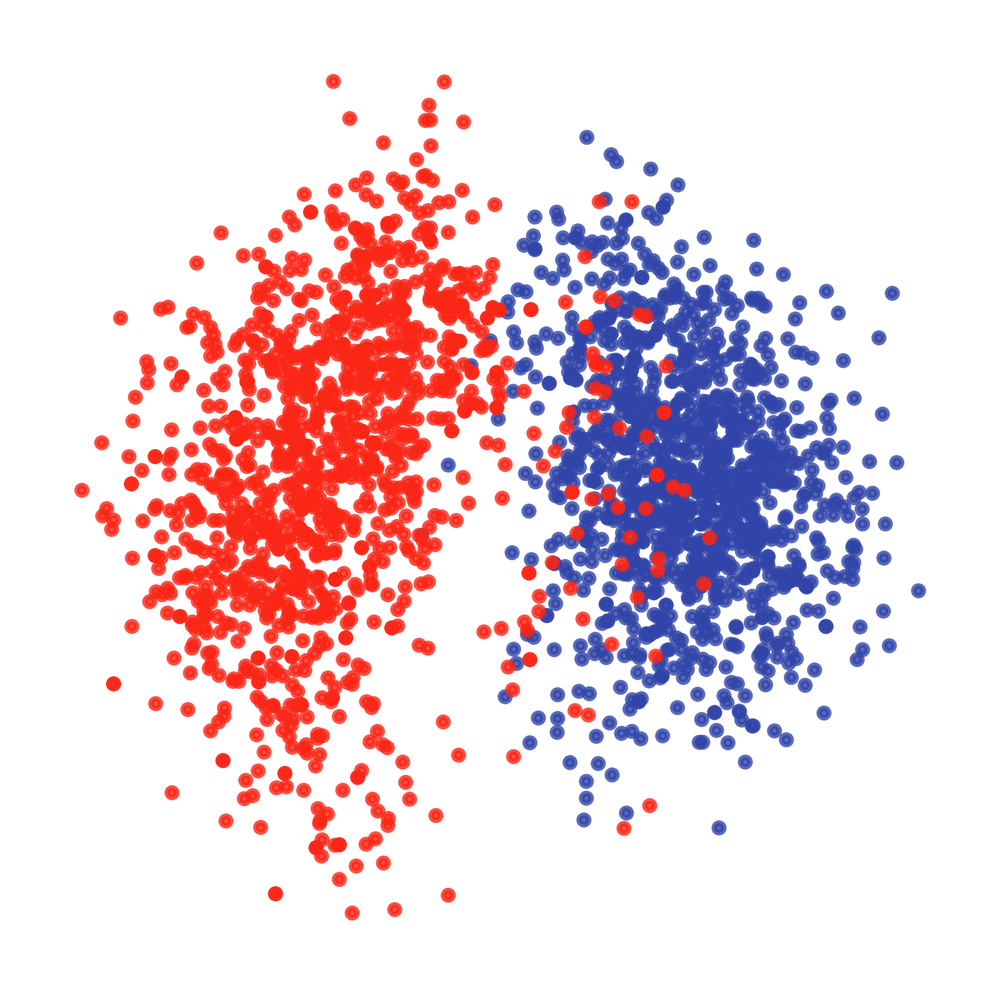

In [64]:
plot_embed(z_sem,size=3,alpha=0.8)

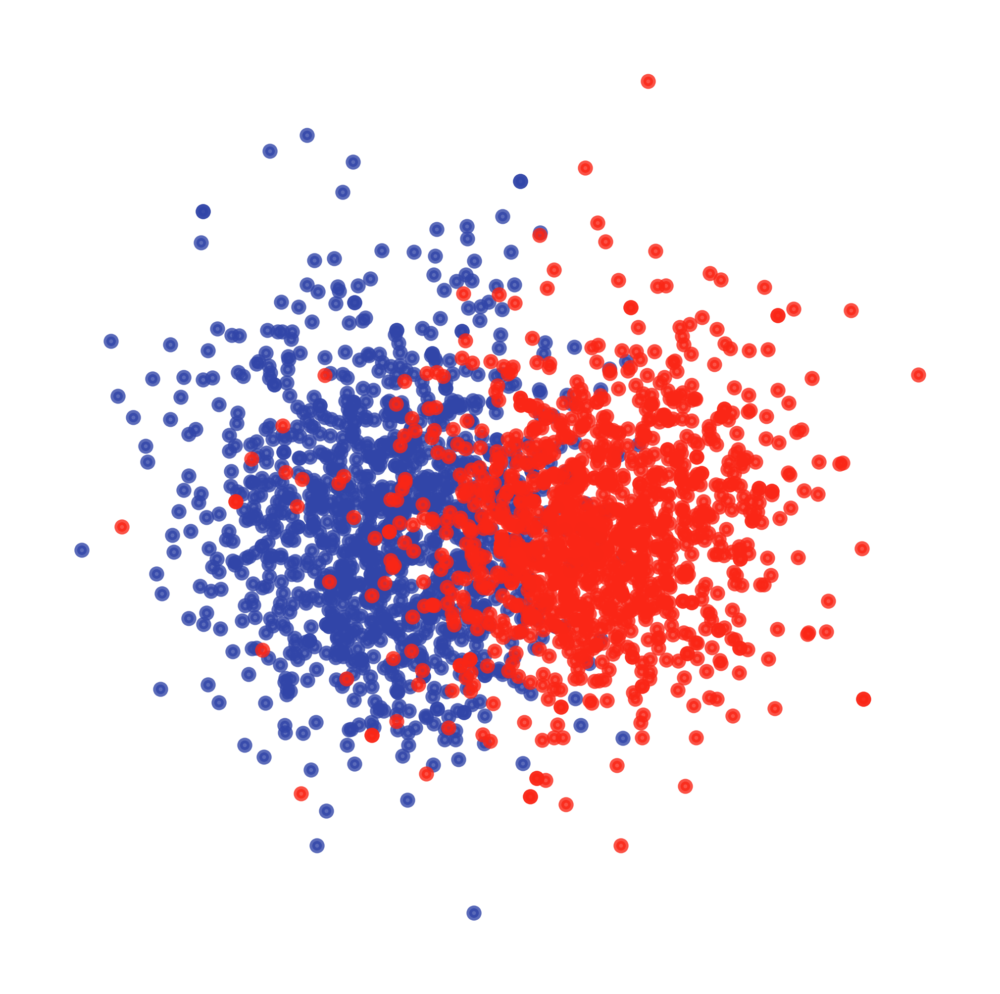

In [63]:
plot_embed(x_T,size=3,alpha=0.8)

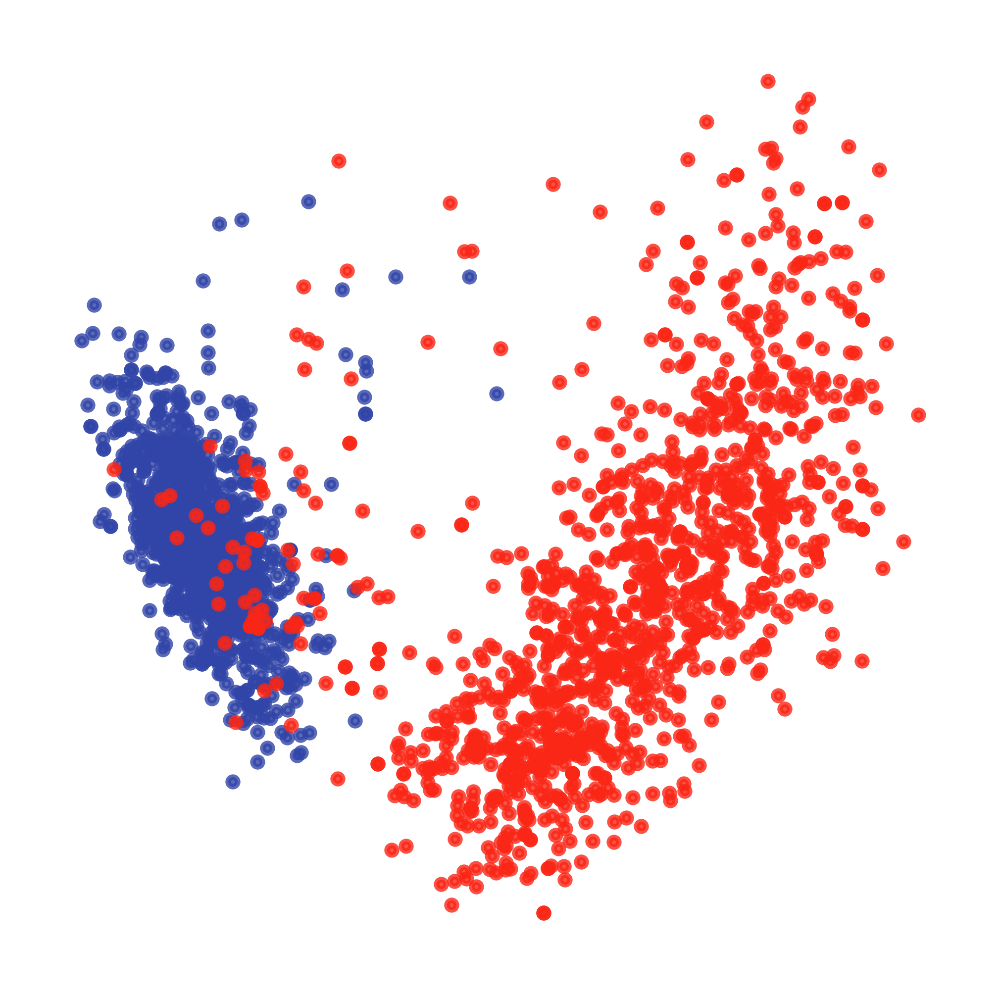

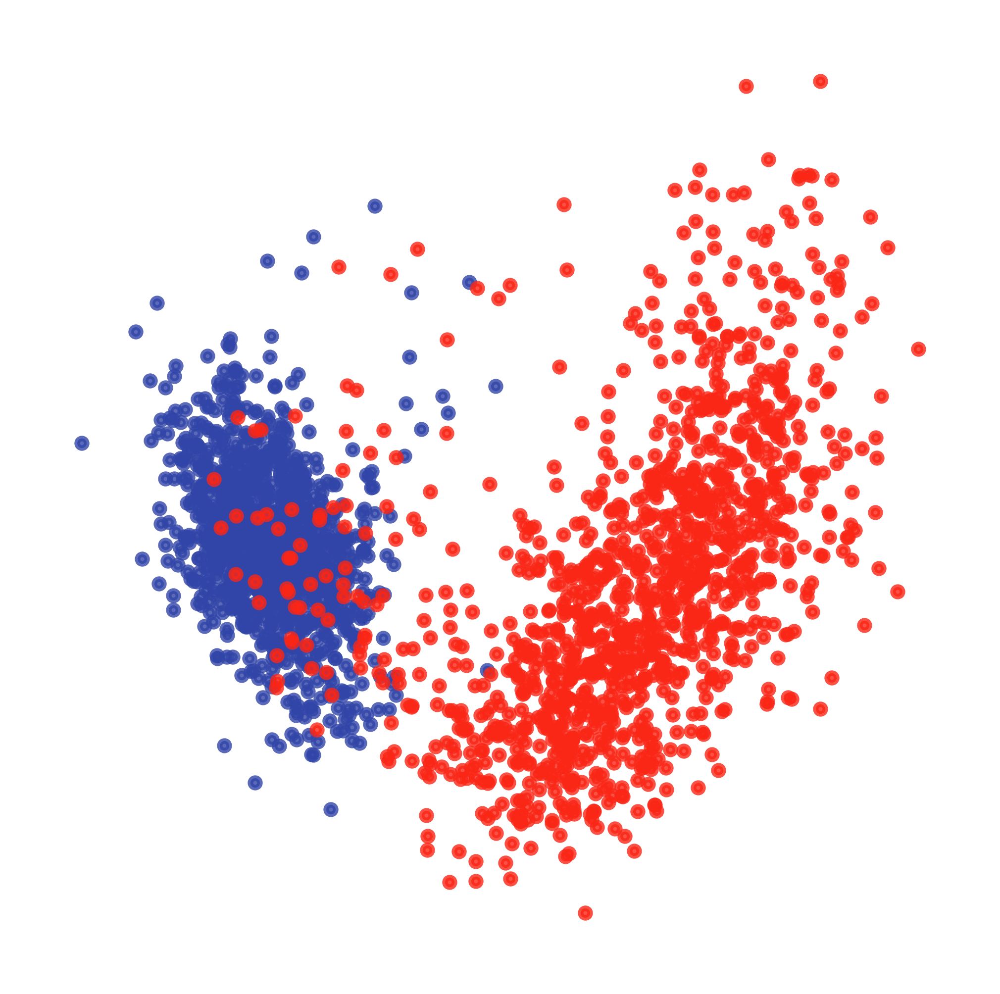

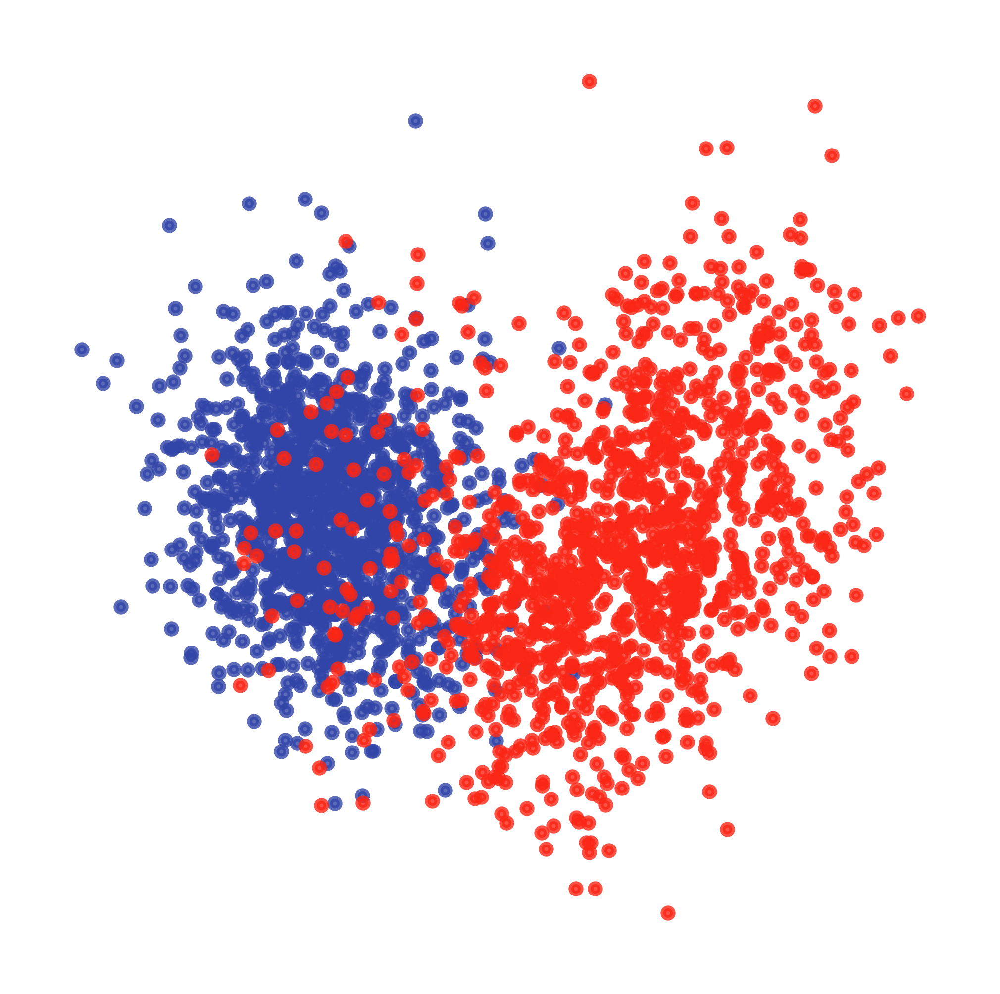

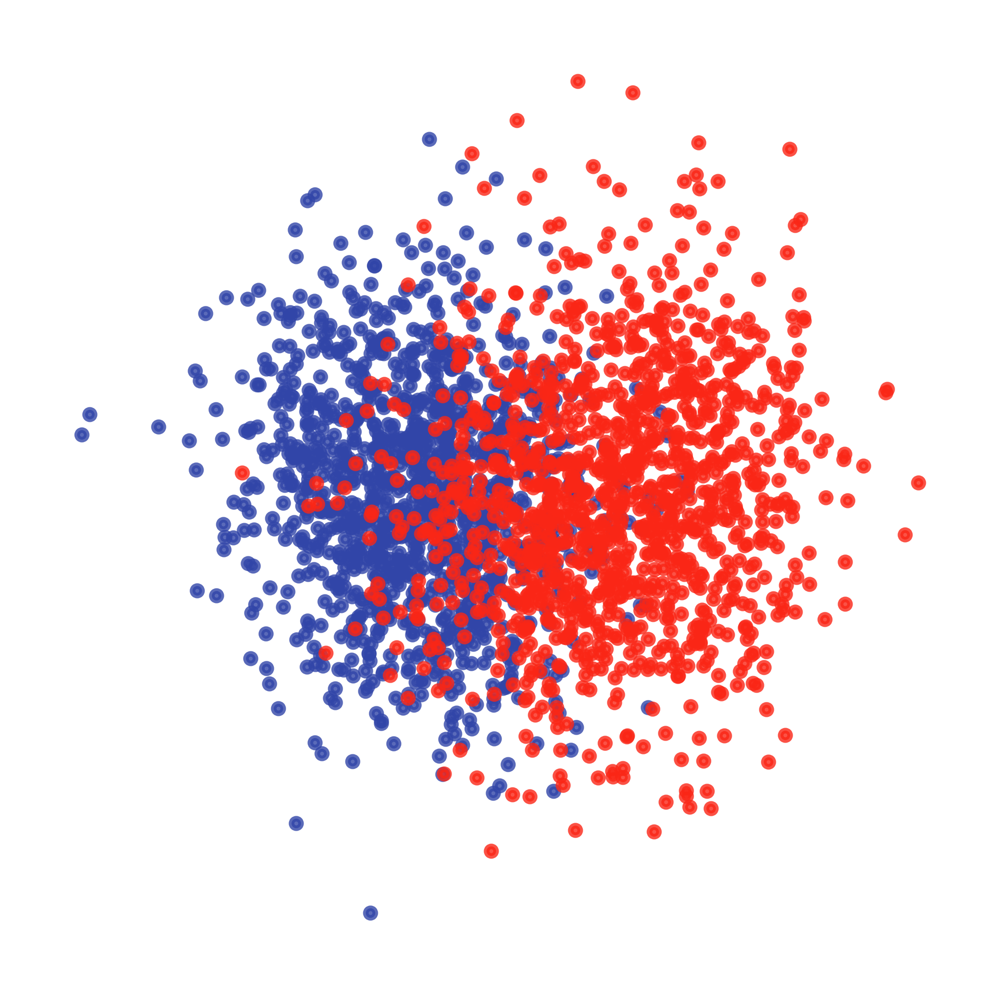

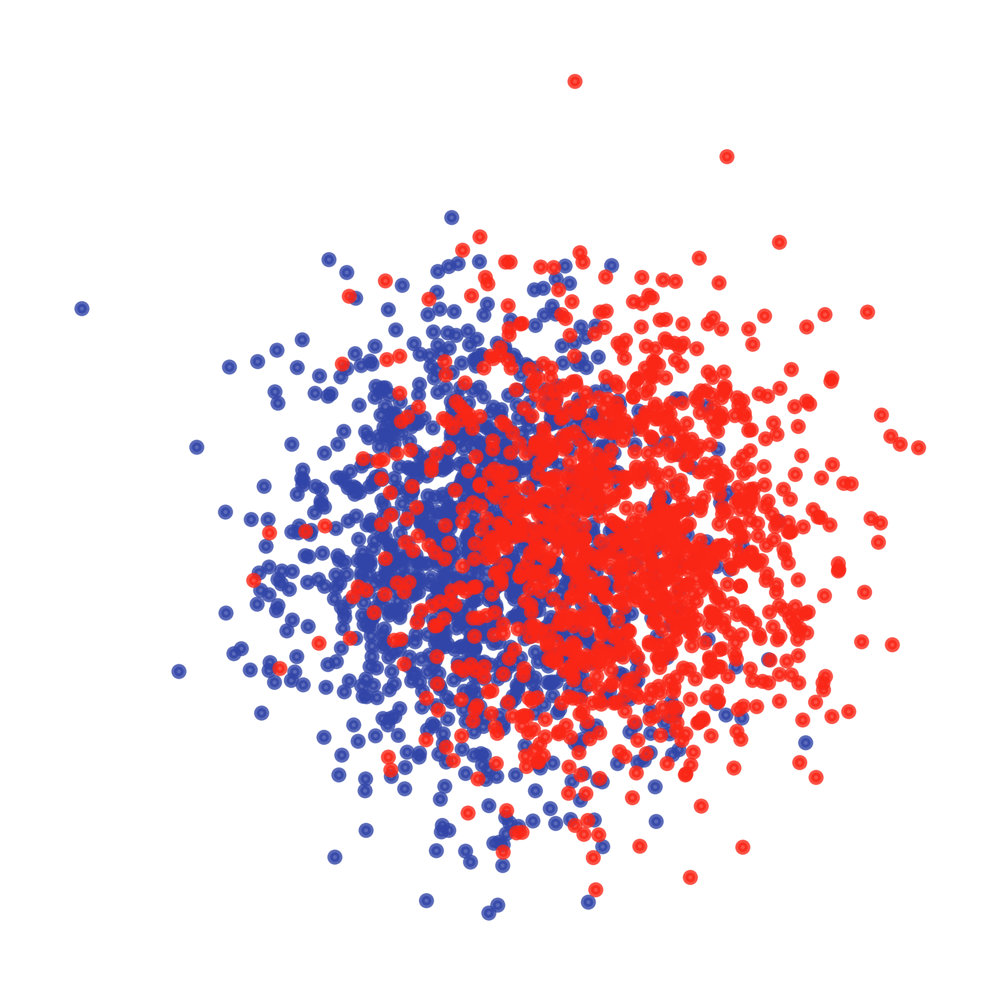

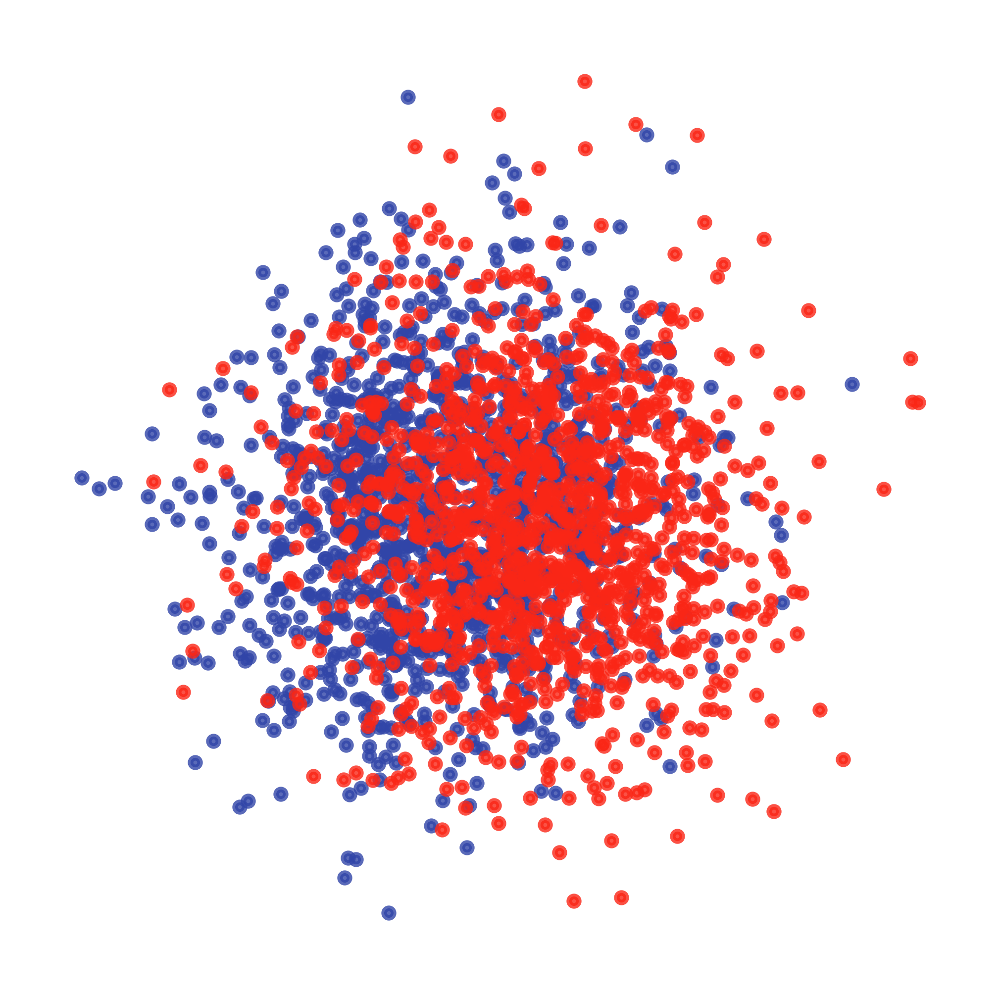

<Figure size 640x480 with 0 Axes>

In [18]:
import torch
import matplotlib.pyplot as plt

# Function to simulate diffusion steps
def get_diffused_data(model, x, t, model_kwargs):
    sample = x
    sample_t = [x]  # Store initial data for plotting
    xstart_t = []
    T = []

    indices = list(range(t))

    for i in indices:
        timestep = torch.full((x.shape[0],), i, device='cuda').long()
        with torch.no_grad():
            # Replacing ddim_reverse_sample with a simpler forward diffusion process
            noise = torch.randn_like(sample)  # Add noise at each step
            out = sample + noise * (i / t)    # Simulating diffusion based on time step
            sample = out
            sample_t.append(sample.cpu())  # Store the samples for visualization
            xstart_t.append(sample.cpu())
            T.append(timestep)

    return {
        'sample': sample,
        'sample_t': sample_t,
        'xstart_t': xstart_t,
        'T': T
    }
result = get_diffused_data(model, 
                           x = torch.tensor(data[0].X, dtype = torch.float32).to('cuda'), 
                           t=999, 
                           model_kwargs=None)



# Function to visualize the diffusion process like in your image
def plot_diffusion(samples, time_steps=[0, 200, 400, 600, 800,999]):
    
    for i, step in enumerate(time_steps):

        data = samples[step].detach().cpu()
        plot_embed(data,size = 3, alpha=0.8)
    plt.tight_layout()
    plt.show()

plot_diffusion(result['sample_t'])


# predict day 1-3 from day 0 and direction 

In [75]:
import scipy
import torch
from sklearn.metrics import r2_score,r2_score

def plot_embed(x_1,x_2,x_3,x_4,label, n_neighbors=50, min_dist=0.01, n_components=2, random_state=42):
    x_ = torch.concat([x_1,x_2,x_3,x_4],axis=0)
    reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=n_components, random_state=random_state)
    embedding = reducer.fit_transform(x_.detach().cpu())
    
    #pca = PCA(n_components=n_components, random_state=random_state)
    #embedding = pca.fit_transform(x_.detach().cpu())
    
    plt.figure(figsize=(6, 4), dpi=600)
    colorlist = ['#3145a8', '#40a8f7', '#f5bf36','#fa2616'] # Colors for day 0 and day 3
    for i in range(4):
        plt.scatter(embedding[label==i, 0], 
                    embedding[label==i, 1], 
                    c=colorlist[i],
                    s=5,
                    alpha=1)
    plt.axis('off')
    plt.show()
    

def cal_metric(x1,x2):
    r2 = r2_score(x1.detach().cpu().numpy().mean(axis=0),
                  x2.X.mean(axis=0))
    pearsonr,_ = scipy.stats.pearsonr(x1.detach().cpu().numpy().mean(axis=0),
                  x2.X.mean(axis=0))
    print('r2=',r2)
    print('pearsonr=',pearsonr)
    return r2, pearsonr

def sample_around_point(point, num_samples=600, scale=0.7):
    return point + scale * np.random.randn(num_samples, point.shape[0])


In [67]:
z_sem = model.encoder(torch.tensor(data[0].X).to('cuda'),
                      #label = torch.tensor(data[2].obs.values, dtype = torch.float32).to('cuda'),
                     )
label = data[0].obs.values[:,0]
direct_z_sem = z_sem[label==3].mean(axis=0) - z_sem[label==0].mean(axis=0)
#direct_xT = x_T[label==3].mean(axis=0) - x_T[label==0].mean(axis=0)

In [85]:
r_all = []
pearsonr_all = []
for i in range(6):
    print(i)
    z_sem_test_day0 = model.encoder(torch.tensor(data[2][data[2].obs['day']==0].X).to('cuda'))
    z_sem_test_day3 = model.encoder(torch.tensor(data[2][data[2].obs['day']==3].X).to('cuda'))

    
    z_sem_interp_day1 = z_sem_test_day0.detach().cpu().numpy().mean(axis=0) + direct_z_sem.detach().cpu().numpy() * 1/3
    z_sem_interp_day1 = sample_around_point(z_sem_interp_day1)
    z_sem_interp_day2 = z_sem_test_day0.detach().cpu().numpy().mean(axis=0) + direct_z_sem.detach().cpu().numpy() * 2/3
    z_sem_interp_day2 = sample_around_point(z_sem_interp_day2)
    z_sem_interp_day3 = z_sem_test_day0.detach().cpu().numpy().mean(axis=0) + direct_z_sem.detach().cpu().numpy() * 3/3
    z_sem_interp_day3 = sample_around_point(z_sem_interp_day3)

    
    logger.log("sampling...")
    sample_fn = (diffusion.p_sample_loop if not args['use_ddim'] else diffusion.ddim_sample_loop)


    sample_interp0 = sample_fn(
                        model,
                        shape = (600, args['gene_size']),
                        clip_denoised=args['clip_denoised'],
                        model_kwargs={
                            'z_mod': z_sem_test_day0
                        },
                        noise =  None,#x_T_test_day0
    )

    sample_interp1 = sample_fn(
                        model,
                        shape = (600, args['gene_size']),
                        clip_denoised=args['clip_denoised'],
                        model_kwargs={
                            'z_mod': torch.tensor(z_sem_interp_day1,dtype=torch.float32).to('cuda')#z_sem[day_labels==1]
                                     },
                        noise =   None,#torch.tensor(xT_interp_day1,dtype=torch.float32).to('cuda')# x_T[day_labels==1]
    )

    sample_interp2 = sample_fn(
                        model,
                        shape = (600, args['gene_size']),
                        clip_denoised=args['clip_denoised'],
                        model_kwargs={
                            'z_mod':  torch.tensor(z_sem_interp_day2,dtype=torch.float32).to('cuda')#z_sem[day_labels==2]
                        },
                        noise =  None,# torch.tensor(xT_interp_day2,dtype=torch.float32).to('cuda')
    )#x_T[day_labels==2]

    sample_interp3 = sample_fn(
                        model,
                        shape = (600, args['gene_size']),
                        clip_denoised=args['clip_denoised'],
                        model_kwargs={
                            'z_mod': z_sem_test_day3
                                     },
                        noise =  None,#torch.tensor(xT_interp_day3,dtype=torch.float32).to('cuda')
    )
    
    r2_, pearsonr_ = cal_metric(sample_interp0, data[2][data[2].obs['day']==0])
    r_all.append(['squidiff',i,'day0',r2_])
    pearsonr_all.append(['squidiff',i,'day0',pearsonr_])
    r2_, pearsonr_ = cal_metric(sample_interp1, data[2][data[2].obs['day']==1])
    r_all.append(['squidiff',i,'day1',r2_])
    pearsonr_all.append(['squidiff',i,'day1',pearsonr_])
    r2_, pearsonr_ = cal_metric(sample_interp2,  data[2][data[2].obs['day']==2])
    r_all.append(['squidiff',i,'day2',r2_])
    pearsonr_all.append(['squidiff',i,'day2',pearsonr_])
    r2_, pearsonr_ = cal_metric(sample_interp3, data[2][data[2].obs['day']==3])
    r_all.append(['squidiff',i,'day3',r2_])
    pearsonr_all.append(['squidiff',i,'day3',pearsonr_])


0
sampling...
r2= 0.9967946456145518
pearsonr= 0.9986806197283917
r2= 0.4244979362055732
pearsonr= 0.8598997679818341
r2= 0.49534730146643124
pearsonr= 0.907199928797177
r2= 0.9946895054495167
pearsonr= 0.997854343037392
1
sampling...
r2= 0.9967297347587656
pearsonr= 0.9986457246017322
r2= 0.42088914006234435
pearsonr= 0.8507627912483622
r2= 0.48188002241408756
pearsonr= 0.9069985198242658
r2= 0.994592726160505
pearsonr= 0.9978357119600423
2
sampling...
r2= 0.9969187497971569
pearsonr= 0.998716165200031
r2= 0.4090944482733698
pearsonr= 0.8512303866559567
r2= 0.49071834484553123
pearsonr= 0.9100856098637795
r2= 0.9949847194129726
pearsonr= 0.9979623860559397
3
sampling...
r2= 0.9969211154307636
pearsonr= 0.9987567129617488
r2= 0.4291604447197376
pearsonr= 0.8502085319467537
r2= 0.5072609129310433
pearsonr= 0.9133465527619336
r2= 0.9947309498752259
pearsonr= 0.9979051997530041
4
sampling...
r2= 0.9966936126833902
pearsonr= 0.9986664785346737
r2= 0.4430368483598207
pearsonr= 0.85753733886

In [86]:
import pandas as pd
pd.DataFrame(r_all).to_csv('/hpc/mydata/siyu.he/Siyu_projects/squidward_study/results/fig2/squidiff_r_all_new.csv')
pd.DataFrame(pearsonr_all).to_csv('/hpc/mydata/siyu.he/Siyu_projects/squidward_study/results/fig2/squidiff_pearsonr_all_new.csv')


In [77]:
r_all = []
pearsonr_all = []
for i in range(1):
    print(i)
    z_sem_test_day0 = model.encoder(torch.tensor(data[2][data[2].obs['day']==0].X).to('cuda'))
    #z_sem_test_day3 = model.encoder(torch.tensor(data[2][data[2].obs['day']==3].X).to('cuda'))
    logger.log("sampling...")
    sample_fn = (diffusion.p_sample_loop if not args['use_ddim'] else diffusion.ddim_sample_loop)


    sample_interp1 = sample_fn(
                        model,
                        shape = (600, args['gene_size']),
                        clip_denoised=args['clip_denoised'],
                        model_kwargs={
                            'z_mod': torch.tensor(z_sem_interp_day1,dtype=torch.float32).to('cuda')#z_sem[day_labels==1]
                                     },
                        noise =   None,#torch.tensor(xT_interp_day1,dtype=torch.float32).to('cuda')# x_T[day_labels==1]
    )

    z_sem_test_interp1 = model.encoder(sample_interp1)
    
    
    z_sem_interp_day2 = z_sem_test_day0.detach().cpu().numpy().mean(axis=0) + direct_z_sem.detach().cpu().numpy() * 1/3
    z_sem_interp_day2 = sample_around_point(z_sem_interp_day2)

    sample_interp2 = sample_fn(
                        model,
                        shape = (600, args['gene_size']),
                        clip_denoised=args['clip_denoised'],
                        model_kwargs={
                            'z_mod':  torch.tensor(z_sem_interp_day2,dtype=torch.float32).to('cuda')#z_sem[day_labels==2]
                        },
                        noise =  None,# torch.tensor(xT_interp_day2,dtype=torch.float32).to('cuda')
    )


0
sampling...


r2= 0.48672811368210367
pearsonr= 0.893983204290015


(0.48672811368210367, 0.893983204290015)

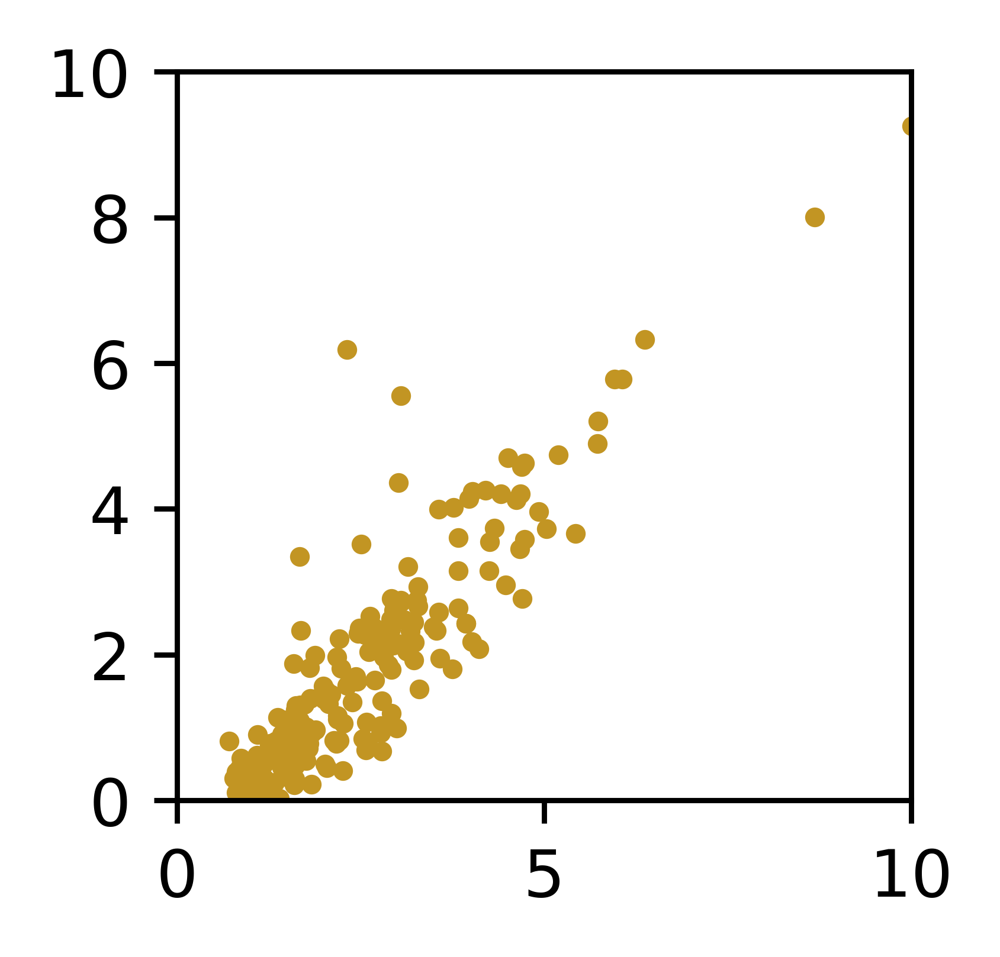

In [80]:
plt.subplots(1,1,figsize=(2,2),dpi=800)
plt.scatter(sample_interp2.detach().cpu().mean(axis=0),
            data[2][data[2].obs['day']==2].X.mean(axis=0),
            s=4,
            c='#c29523'
           )
plt.xlim([0,10])
plt.ylim([0,10])

cal_metric(sample_interp2, data[2][data[2].obs['day']==2])

/hpc/mydata/siyu.he/anaconda/2023.03/x86_64/envs/scvi_v1_env/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


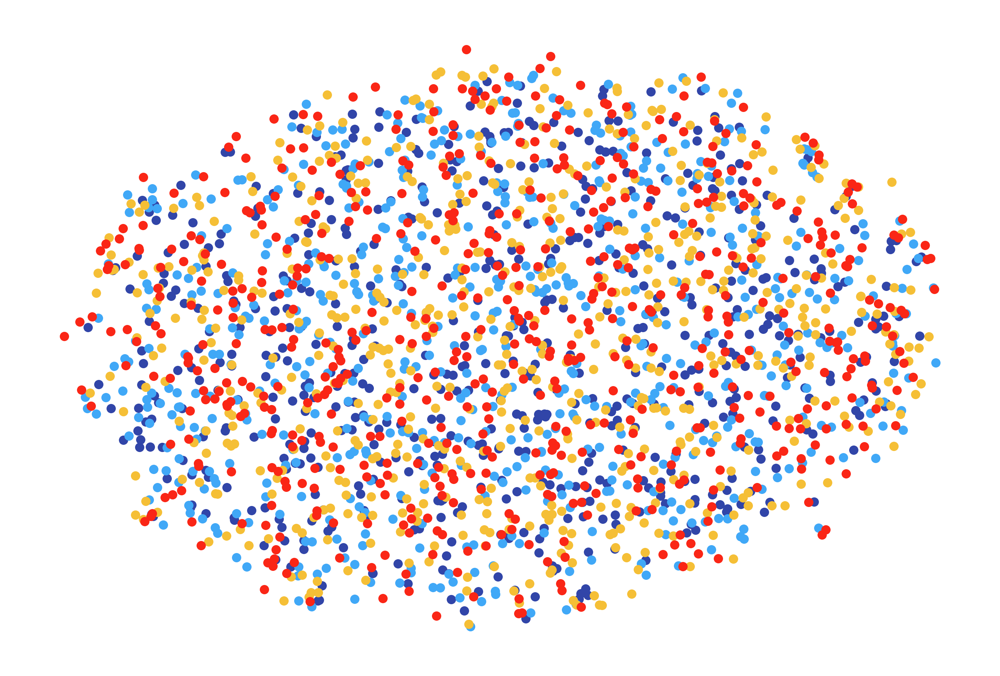

In [68]:
import umap
label = [0]*600+[1]*600+[2]*600+[3]*600
plot_embed(z_sem_test_day0, 
           torch.tensor(z_sem_interp_day1).to('cuda'),
           torch.tensor(z_sem_interp_day2).to('cuda'),
           torch.tensor(z_sem_interp_day3).to('cuda'),
           label=np.array(label))


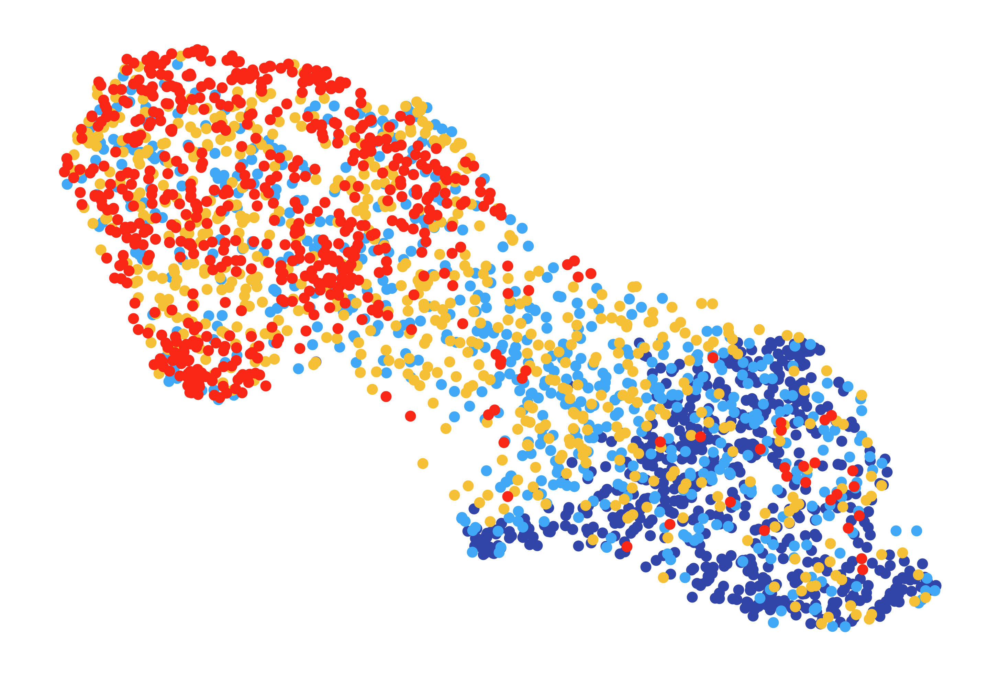

In [87]:
# Combine all points
from sklearn.decomposition import PCA

combined_points = np.concatenate([sample_interp0.detach().cpu().numpy(),
                                  sample_interp1.detach().cpu().numpy(),
                                  sample_interp2.detach().cpu().numpy(),
                                  sample_interp3.detach().cpu().numpy(),
                                 ], axis=0)
combined_labels  = np.array([0]*600+[1]*600+[2]*600+[3]*600)

pca = PCA(n_components=30)  # You can adjust the number of components
pca_result = pca.fit_transform(combined_points)
#pca_result

# Perform UMAP with increased neighbors
reducer = umap.UMAP(n_neighbors=50, min_dist=0.2, n_components=2)
embedding_combined = reducer.fit_transform(pca_result)

# Plotting
plt.figure(figsize=(6, 4), dpi=600)
colorlist = ['#3145a8', '#40a8f7', '#f5bf36', '#fa2616']  # Green and Magenta for interpolated points
for i in range(4):
    plt.scatter(embedding_combined[combined_labels == i, 0], 
                embedding_combined[combined_labels == i, 1], 
                c=colorlist[i], 
                s=8, 
                alpha=1)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.axis('off')
#plt.title('UMAP with Linear Interpolation between day0 and day3')
plt.show()


(0.0, 10.0)

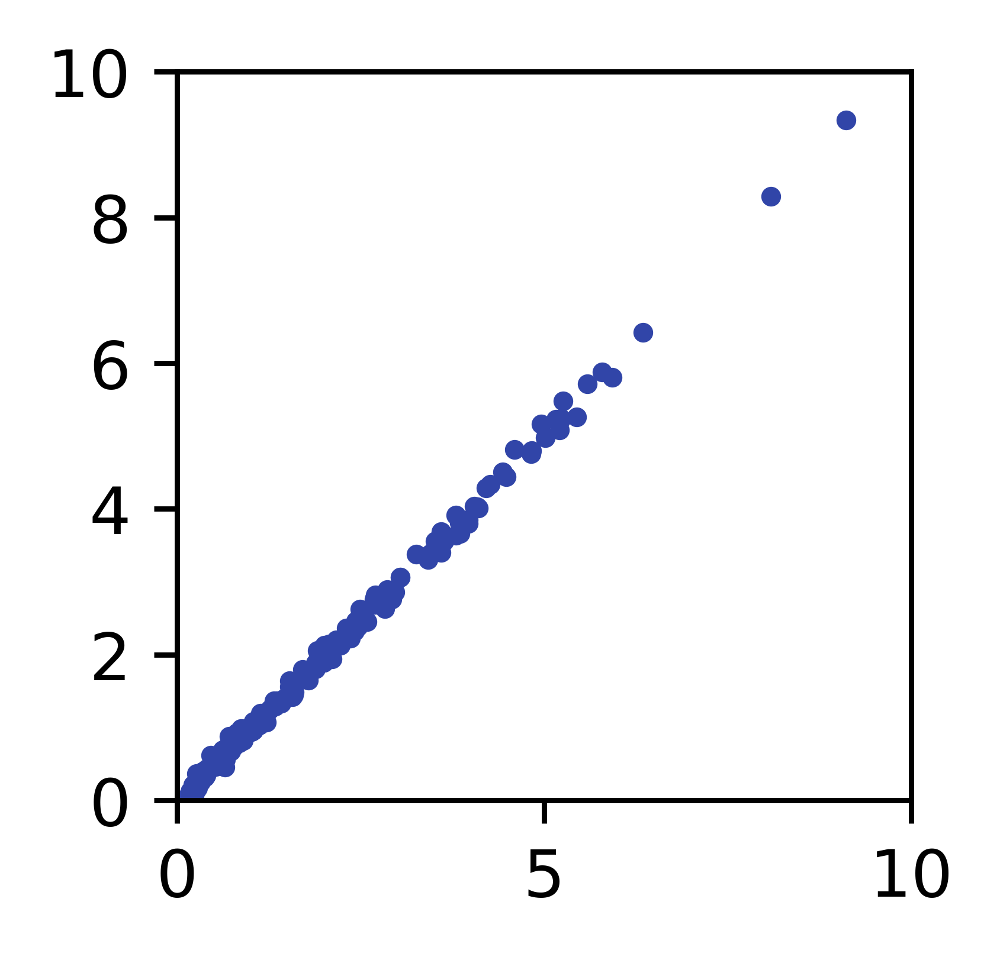

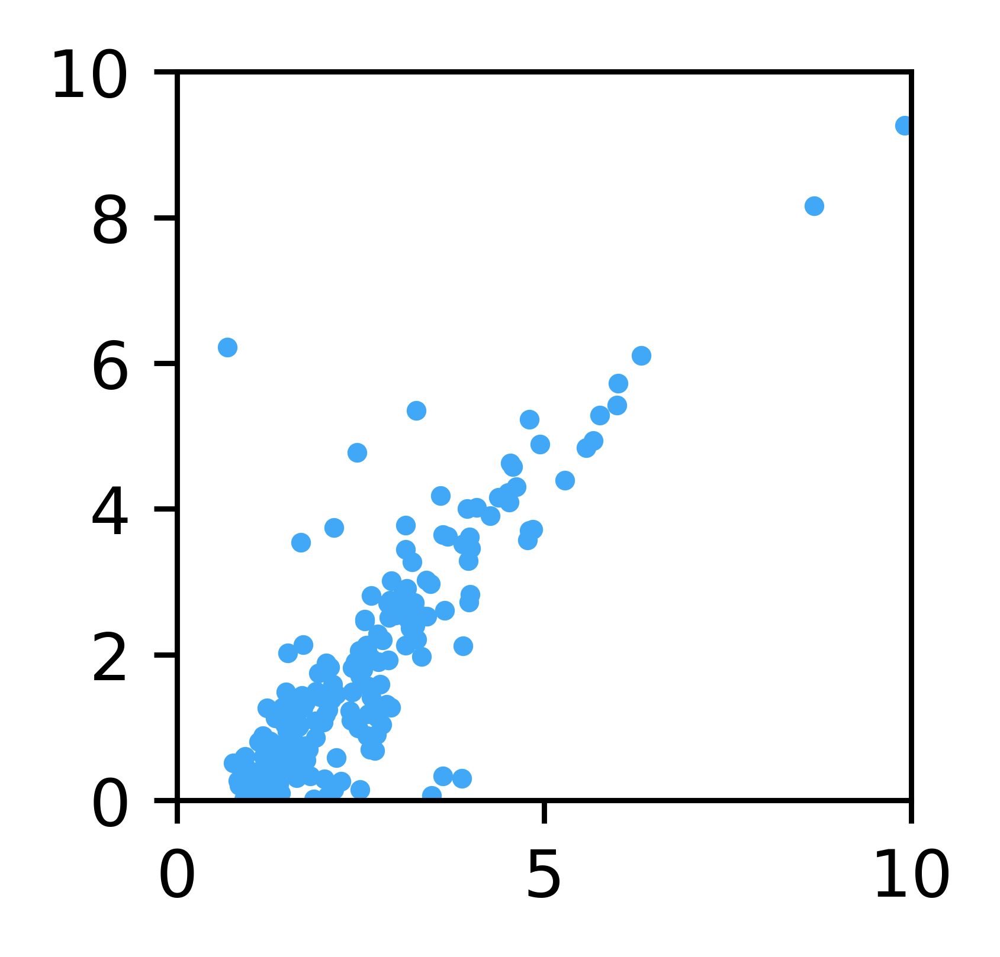

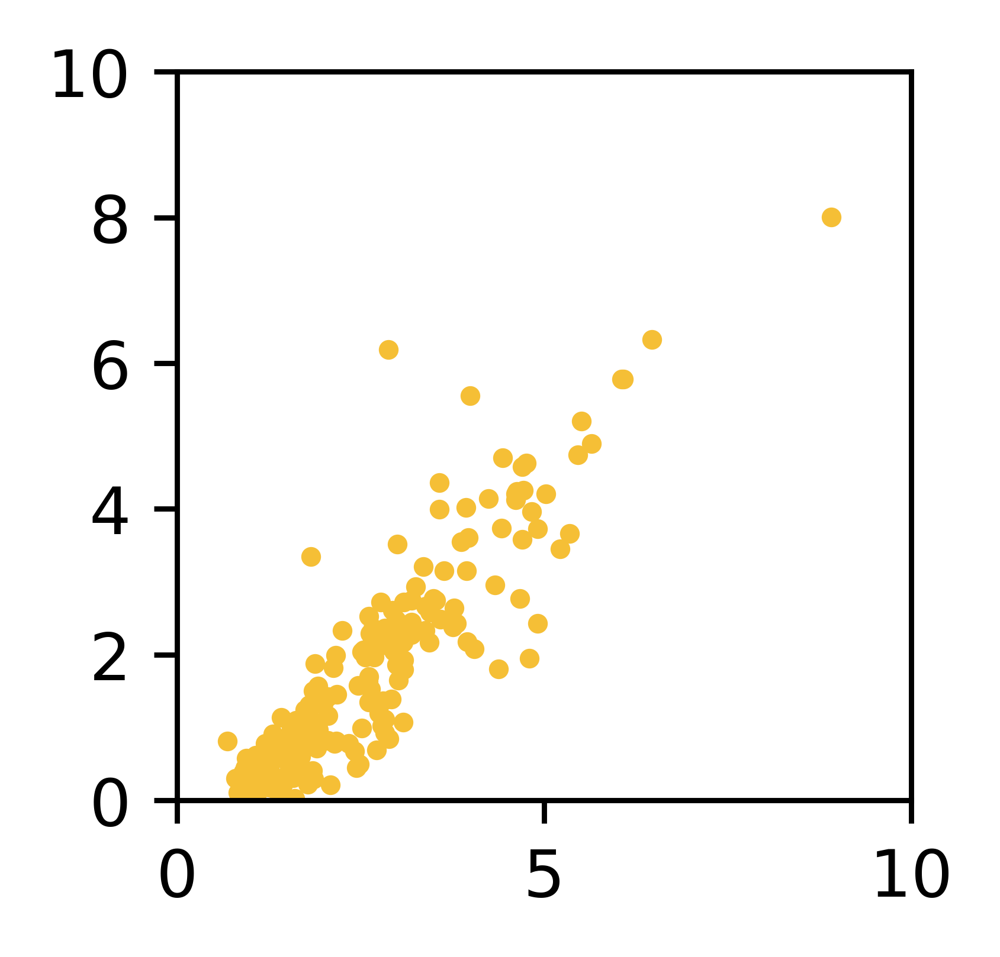

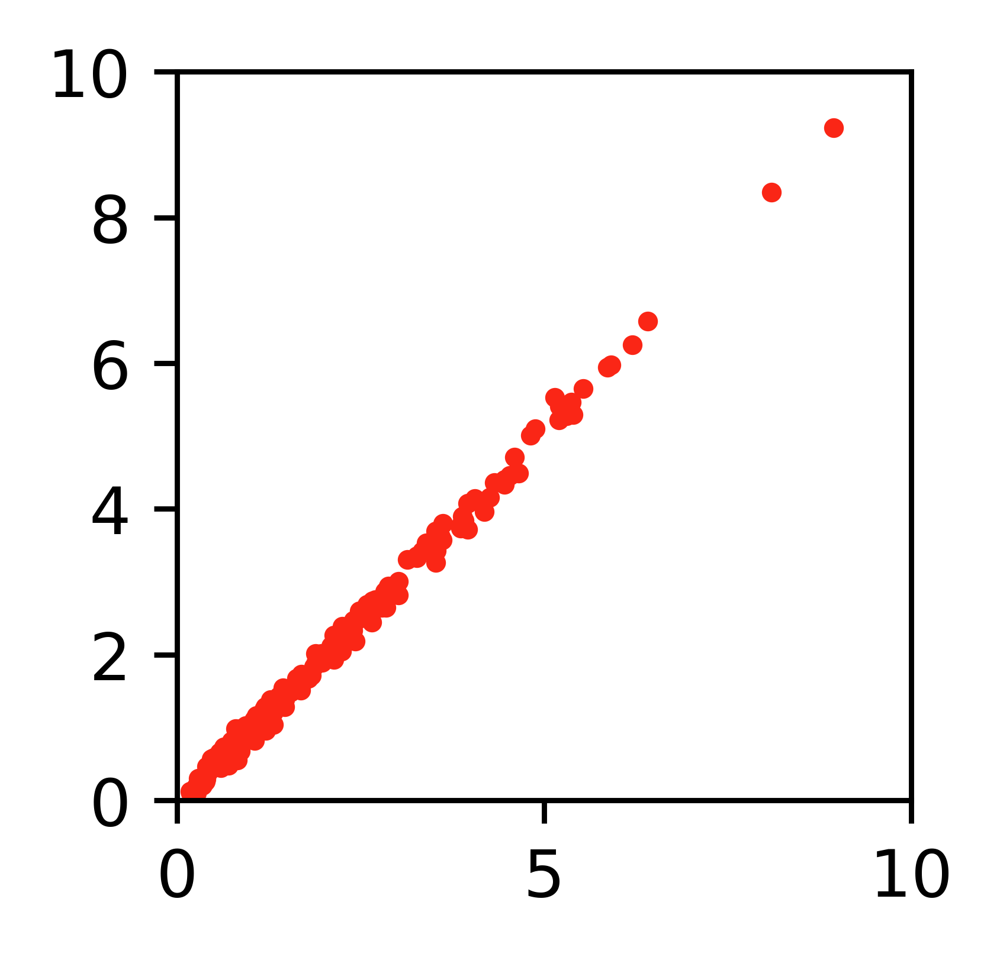

In [38]:
plt.subplots(1,1,figsize=(2,2),dpi=800)
plt.scatter(sample_interp0.detach().cpu().mean(axis=0),
            data[2][data[2].obs['day']==0].X.mean(axis=0),
            s=4,
            c='#3145a8'
           )
plt.xlim([0,10])
plt.ylim([0,10])

plt.subplots(1,1,figsize=(2,2),dpi=800)
plt.scatter(sample_interp1.detach().cpu().mean(axis=0),
            data[2][data[2].obs['day']==1].X.mean(axis=0),
            s=4,
            c='#40a8f7'
           )
plt.xlim([0,10])
plt.ylim([0,10])

plt.subplots(1,1,figsize=(2,2),dpi=800)
plt.scatter(sample_interp2.detach().cpu().mean(axis=0),
            data[2][data[2].obs['day']==2].X.mean(axis=0),
            s=4,
            c='#f5bf36'
           )
plt.xlim([0,10])
plt.ylim([0,10])

plt.subplots(1,1,figsize=(2,2),dpi=800)
plt.scatter(sample_interp3.detach().cpu().mean(axis=0),
            data[2][data[2].obs['day']==3].X.mean(axis=0),
            s=4,
            c='#fa2616'
           )
plt.xlim([0,10])
plt.ylim([0,10])

In [88]:
cal_metric(sample_interp0, data[2][data[2].obs['day']==0])
cal_metric(sample_interp1, data[2][data[2].obs['day']==1])
cal_metric(sample_interp2, data[2][data[2].obs['day']==2])
cal_metric(sample_interp3, data[2][data[2].obs['day']==3])

r2= 0.9969101092746799
pearsonr= 0.9987177390253665
r2= 0.42947796202081023
pearsonr= 0.8519994208581175
r2= 0.45870601895416674
pearsonr= 0.9072124966286764
r2= 0.9945432567070595
pearsonr= 0.9977612646920893


(0.9945432567070595, 0.9977612646920893)

In [89]:
import anndata
pred_tensor =np.array( torch.cat([sample_interp0,sample_interp1,sample_interp2,sample_interp3], dim=0).detach().cpu())
all_new_data = anndata.AnnData(pred_tensor)
all_new_data.obs['weights'] = combined_labels
all_new_data.obs['weights'] = all_new_data.obs['weights'].astype(str).astype('category')
all_new_data.var_names = data[2].var_names
all_new_data.obs.groupby('weights').mean()

/tmp/ipykernel_339955/2187364578.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  all_new_data.obs.groupby('weights').mean()


""
weights
0
1
2
3


In [90]:
import scanpy as sc
sc.tl.rank_genes_groups(all_new_data, groupby='weights', method='wilcoxon')
all_new_data.layers['scaled'] = sc.pp.scale(all_new_data, copy=True).X
marker_genes_dict = {
    '0.0': ['T', 'GATA6','NANOG'],
}

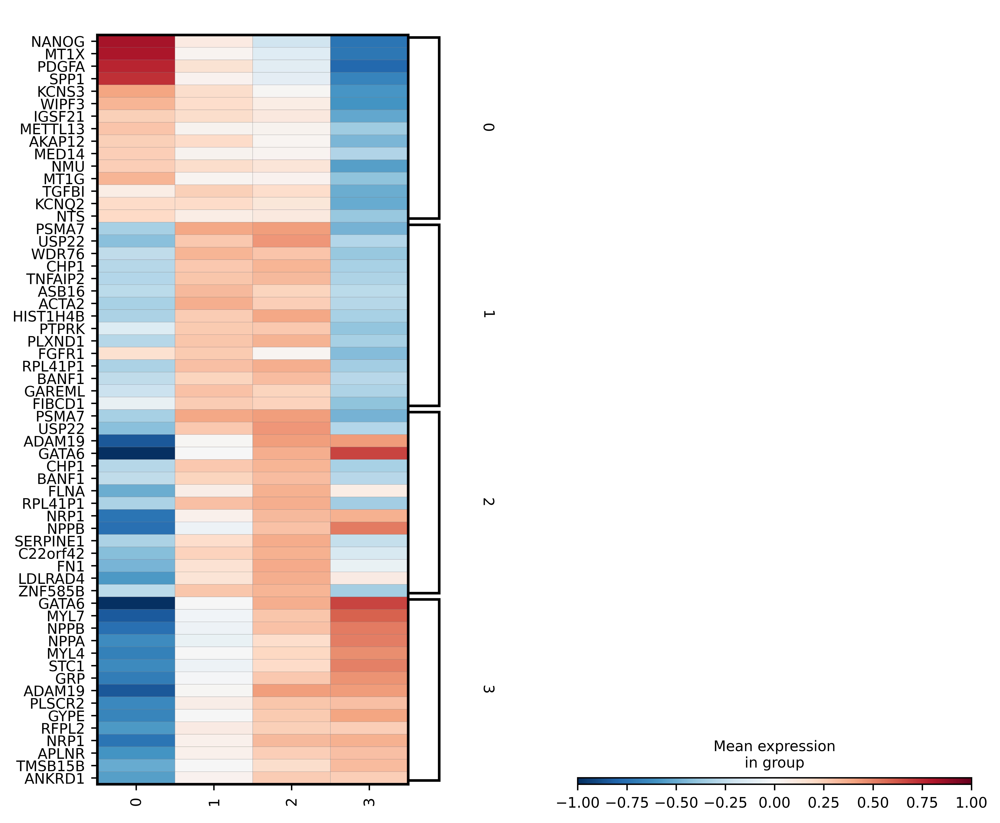

In [91]:
fig,ax = plt.subplots(figsize =(9,8),dpi=800)
sc.pl.rank_genes_groups_matrixplot(all_new_data, 
                                dendrogram=False,
                                n_genes=15, 
                                   use_raw=False, 
                                swap_axes=True, 
                                vmin=-1, vmax=1, 
                                cmap='RdBu_r', 
                                layer='scaled', 
                                   ax=ax,
                                show=False);

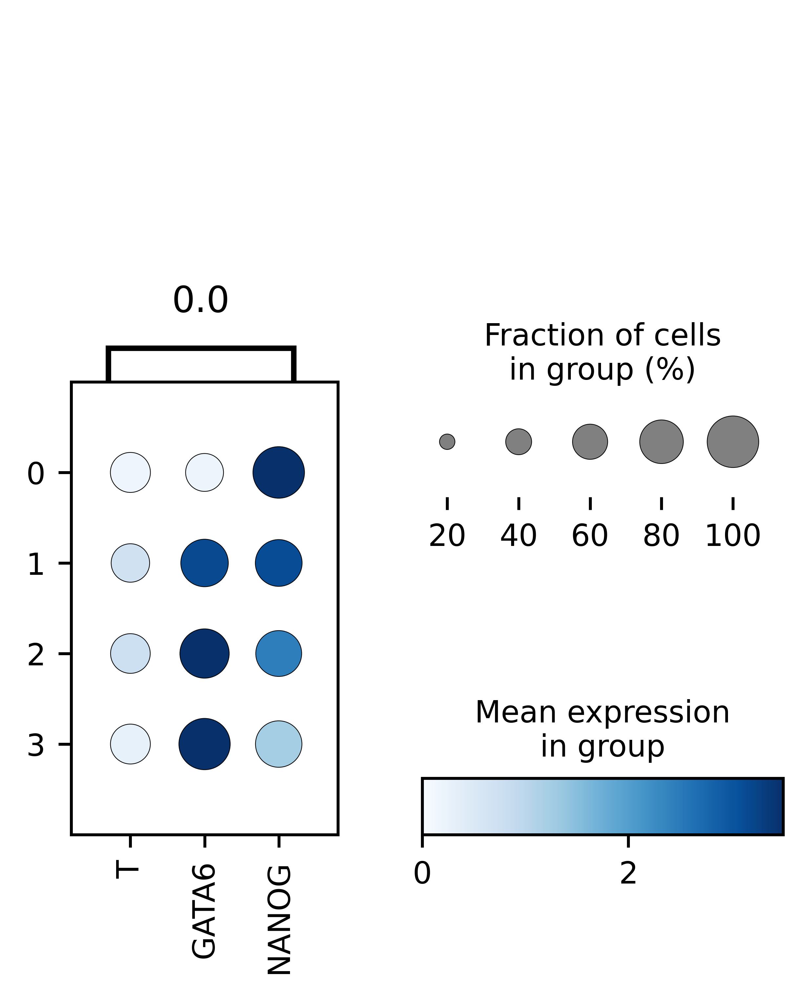

In [96]:
fig,ax = plt.subplots(figsize =(3.5,4),dpi=800)
sc.pl.dotplot(all_new_data, 
              marker_genes_dict, 'weights', 
              vmin=0,
              vmax=3.5,
              dendrogram=False,
              ax=ax,
              cmap='Blues'
             )

In [44]:
all_new_data.obs['T']=all_new_data[:,'T'].to_df()
all_new_data.obs.groupby('weights').mean()

/tmp/ipykernel_339955/2246455796.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  all_new_data.obs.groupby('weights').mean()


,T
weights,
0,0.165917
1,0.687577
2,0.684271
3,0.288087


In [45]:
all_new_data

AnnData object with n_obs × n_vars = 2400 × 203
    obs: 'weights', 'T'
    uns: 'rank_genes_groups'
    layers: 'scaled'

In [97]:
sc.pp.neighbors(all_new_data,n_neighbors=20,n_pcs=50)
sc.tl.umap(all_new_data,min_dist=1.5)

         Falling back to preprocessing with `sc.pp.pca` and default params.


0
1
2
3


(-0.4064087897539139,
 19.208042803406716,
 -13.877644038200378,
 4.119495368003845)

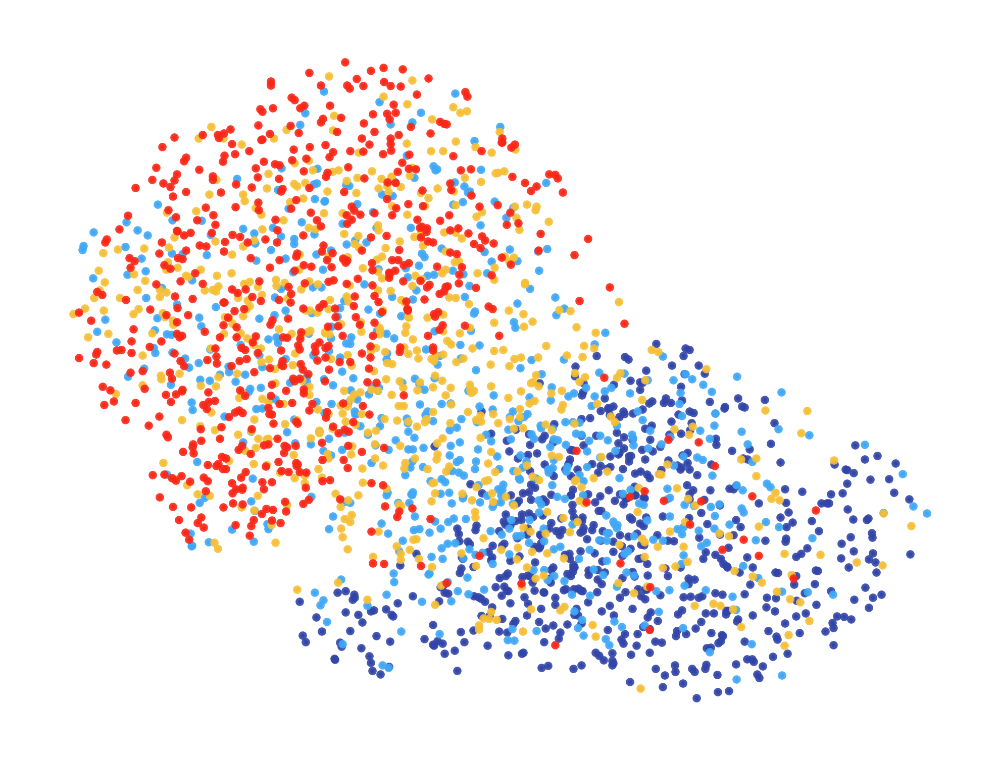

In [98]:
import matplotlib.colors as mcolors
hex_colors = ['#3145a8', '#40a8f7', '#f5bf36','#fa2616']

# Convert hexadecimal to RGB
rgb_colors = [mcolors.to_rgb(color) for color in hex_colors]

# Create a custom colormap from these colors
cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", rgb_colors)


fig, axs = plt.subplots(1,1,figsize=(4,3),dpi=600)
for i in np.unique(all_new_data.obs['weights']):
    print(i)
    g=axs.scatter(all_new_data.obsm['X_umap'][all_new_data.obs['weights']==i, 0], 
                  all_new_data.obsm['X_umap'][all_new_data.obs['weights']==i, 1], 
                  color=rgb_colors[list(np.unique(all_new_data.obs['weights'])).index(i)], 
                  alpha=0.9,s=1, label='Reconstructed')
#plt.legend(np.unique(subsamp_adata.obs['day']))
plt.axis('off')

In [99]:
del all_new_data.obsp
del all_new_data.layers
del all_new_data.uns

In [101]:
all_new_data.write('figure2_diff_recon_1022.h5ad')
all_new_data.write('/hpc/mydata/siyu.he/Siyu_projects/squidward_study/results/fig2/figure2_diff_recon_1022.h5ad')

In [102]:
import pandas as pd
p_time = pd.read_csv('figure2_dataset1_time_1022.csv',index_col=0)


In [105]:
all_new_data.obs['Pseudotime'] = p_time.values

/tmp/ipykernel_339955/1007087023.py:15: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().set_visible(False)


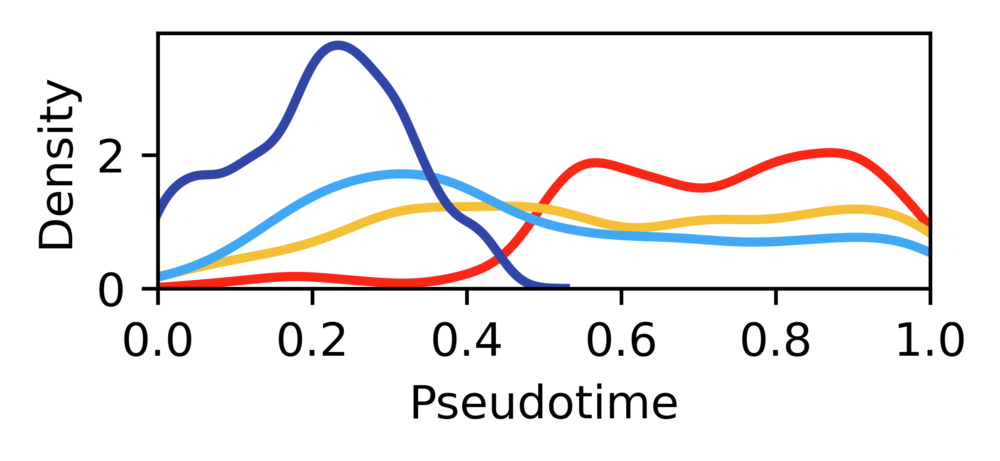

In [106]:
import seaborn as sns
import matplotlib.pyplot as plt
hex_colors = ['#3145a8', '#40a8f7', '#f5bf36','#fa2616']


plt.figure(figsize=(3,1
                   ),dpi=800)
sns.kdeplot(data=all_new_data.obs, 
            x="Pseudotime", 
            hue="weights", 
            bw_adjust=.8,
            palette=hex_colors,
            linewidth=2  ,  
            common_norm=False)
plt.legend().set_visible(False)
plt.xlabel("Pseudotime")
plt.ylabel("Density")
plt.xlim([0,1])
plt.show()

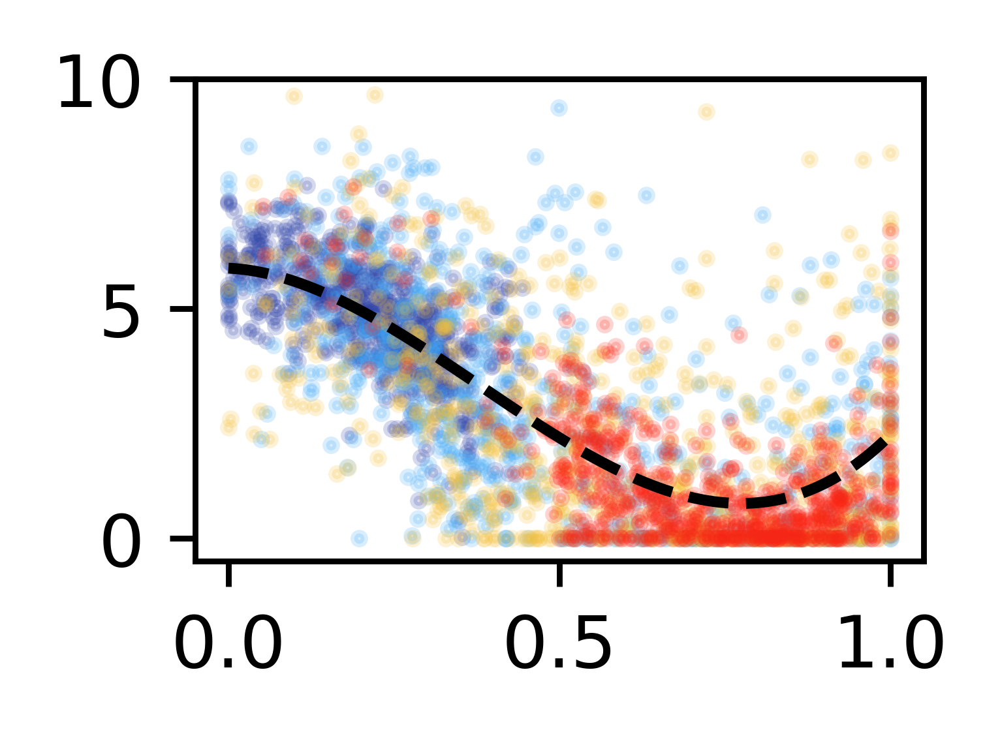

In [107]:
plt.figure(figsize=(1.8,1.2),dpi=800)
from scipy.optimize import curve_fit
hex_colors = ['#3145a8', '#40a8f7', '#f5bf36','#fa2616']

gene_name = 'NANOG'
for i,j in enumerate(np.array([0,1,2,3]).astype(str)):
    plt.scatter(all_new_data[all_new_data.obs['weights'] == j].obs['Pseudotime'],
                all_new_data[all_new_data.obs['weights'] == j].to_df().loc[:, gene_name],
                color=hex_colors[i],
                s=2,
                alpha=0.2
               )
all_new_data_df = pd.DataFrame({
    'Pseudotime': all_new_data.obs['Pseudotime'],
    gene_name: all_new_data.to_df().loc[:, gene_name]
})
# Define a function for curve fitting, e.g., a polynomial of 3rd degree
def poly3(x, a, b, c, d):
    return a * x**3 + b * x**2 + c * x + d

# Fit the curve
popt, pcov = curve_fit(poly3, all_new_data_df['Pseudotime'], all_new_data_df[gene_name])

# Generate x values for the fitted curve
x_fit = np.linspace(0, 1, 2000)
y_fit = poly3(x_fit, *popt)


# Plot the fitted curve
plt.plot(x_fit, y_fit, color='black', linestyle='--', linewidth=1.5)
plt.ylim([-0.5,10])
plt.show()

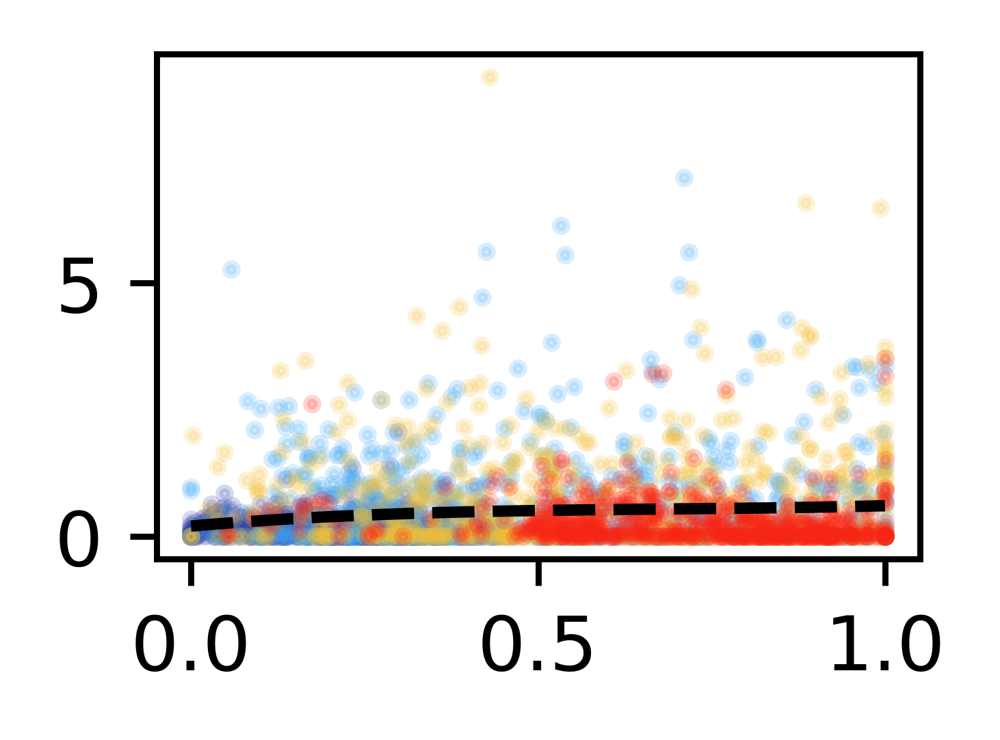

In [108]:
plt.figure(figsize=(1.8,1.2),dpi=800)
from scipy.optimize import curve_fit
hex_colors = ['#3145a8', '#40a8f7', '#f5bf36','#fa2616']

gene_name = 'T'
for i,j in enumerate(np.array([0,1,2,3]).astype(str)):
    plt.scatter(all_new_data[all_new_data.obs['weights'] == j].obs['Pseudotime'],
                all_new_data[all_new_data.obs['weights'] == j].to_df().loc[:, gene_name],
                color=hex_colors[i],
                s=2,
                alpha=0.2
               )
all_new_data_df = pd.DataFrame({
    'Pseudotime': all_new_data.obs['Pseudotime'],
    gene_name: all_new_data.to_df().loc[:, gene_name]
})
# Define a function for curve fitting, e.g., a polynomial of 3rd degree
def poly3(x, a, b, c, d):
    return a * x**3 + b * x**2 + c * x + d

# Fit the curve
popt, pcov = curve_fit(poly3, all_new_data_df['Pseudotime'], all_new_data_df[gene_name])

# Generate x values for the fitted curve
x_fit = np.linspace(0, 1, 2000)
y_fit = poly3(x_fit, *popt)


# Plot the fitted curve
plt.plot(x_fit, y_fit, color='black', linestyle='--', linewidth=1.5)

plt.show()

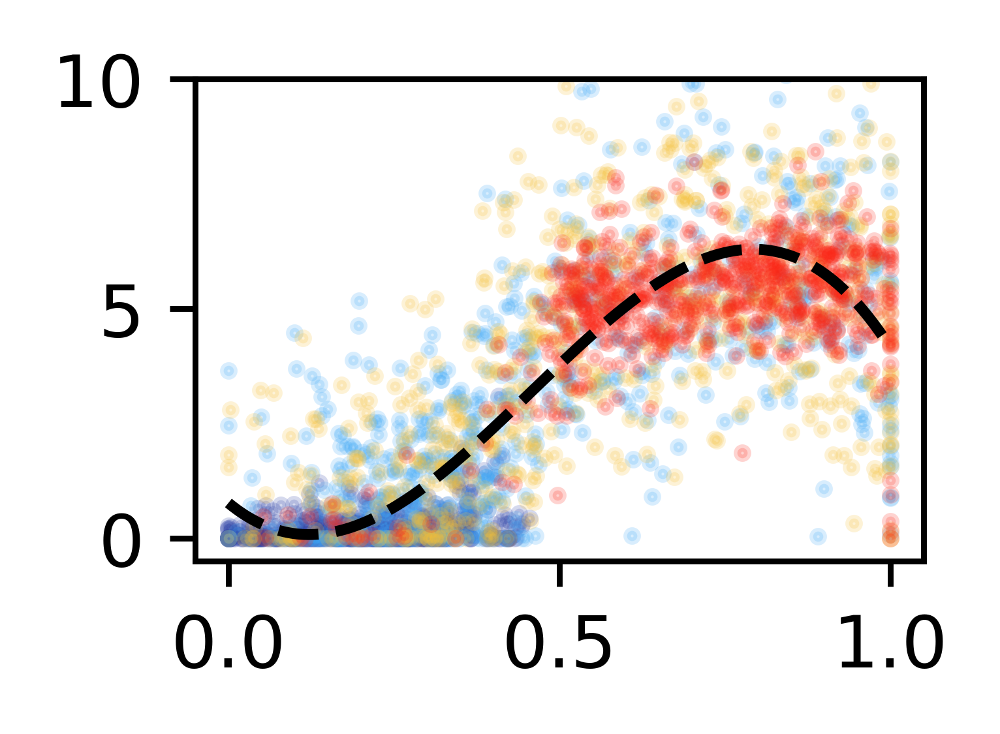

In [109]:
plt.figure(figsize=(1.8,1.2),dpi=800)
from scipy.optimize import curve_fit
hex_colors = ['#3145a8', '#40a8f7', '#f5bf36','#fa2616']

gene_name = 'GATA6'
for i,j in enumerate(np.array([0,1,2,3]).astype(str)):
    plt.scatter(all_new_data[all_new_data.obs['weights'] == j].obs['Pseudotime'],
                all_new_data[all_new_data.obs['weights'] == j].to_df().loc[:, gene_name],
                color=hex_colors[i],
                s=2,
                alpha=0.2
               )
all_new_data_df = pd.DataFrame({
    'Pseudotime': all_new_data.obs['Pseudotime'],
    gene_name: all_new_data.to_df().loc[:, gene_name]
})
# Define a function for curve fitting, e.g., a polynomial of 3rd degree
def poly3(x, a, b, c, d):
    return a * x**3 + b * x**2 + c * x + d

# Fit the curve
popt, pcov = curve_fit(poly3, all_new_data_df['Pseudotime'], all_new_data_df[gene_name])

# Generate x values for the fitted curve
x_fit = np.linspace(0, 1, 2000)
y_fit = poly3(x_fit, *popt)


# Plot the fitted curve
plt.plot(x_fit, y_fit, color='black', linestyle='--', linewidth=1.5)
plt.ylim([-0.5,10])
plt.show()

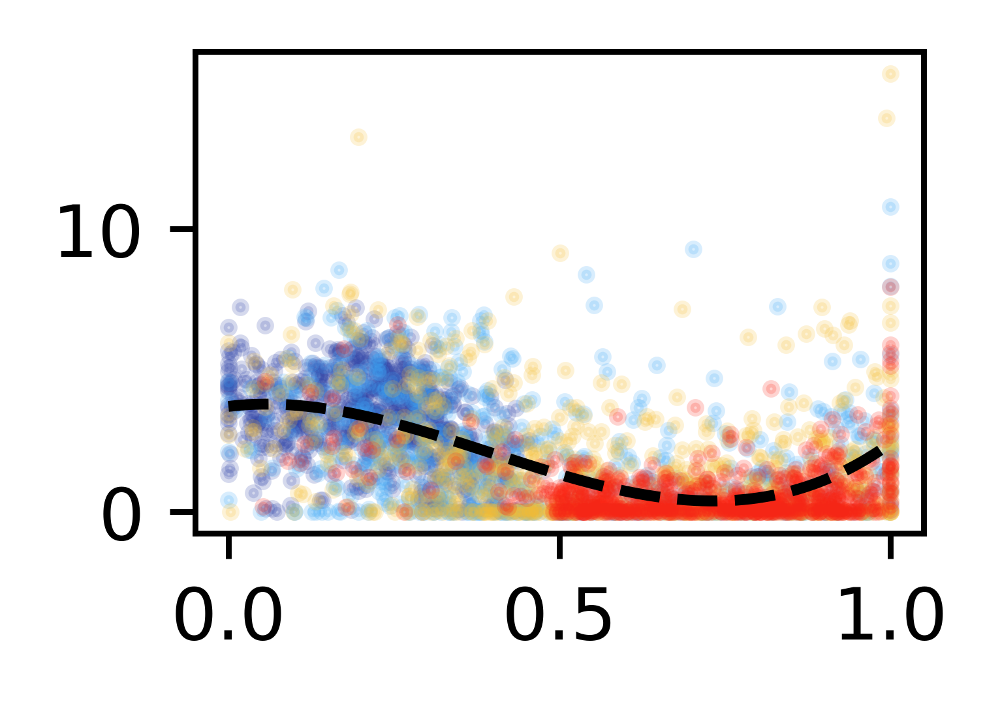

In [110]:
plt.figure(figsize=(1.8,1.2),dpi=800)
from scipy.optimize import curve_fit
hex_colors = ['#3145a8', '#40a8f7', '#f5bf36','#fa2616']

gene_name = 'SPP1'
for i,j in enumerate(np.array([0,1,2,3]).astype(str)):
    plt.scatter(all_new_data[all_new_data.obs['weights'] == j].obs['Pseudotime'],
                all_new_data[all_new_data.obs['weights'] == j].to_df().loc[:, gene_name],
                color=hex_colors[i],
                s=2,
                alpha=0.2
               )
all_new_data_df = pd.DataFrame({
    'Pseudotime': all_new_data.obs['Pseudotime'],
    gene_name: all_new_data.to_df().loc[:, gene_name]
})
# Define a function for curve fitting, e.g., a polynomial of 3rd degree
def poly3(x, a, b, c, d):
    return a * x**3 + b * x**2 + c * x + d

# Fit the curve
popt, pcov = curve_fit(poly3, all_new_data_df['Pseudotime'], all_new_data_df[gene_name])

# Generate x values for the fitted curve
x_fit = np.linspace(0, 1, 2000)
y_fit = poly3(x_fit, *popt)


# Plot the fitted curve
plt.plot(x_fit, y_fit, color='black', linestyle='--', linewidth=1.5)

plt.show()

In [111]:
wnt_signaling = ["ADAM17",
 "AXIN1",
 "AXIN2",
 "CCND2",
 "CSNK1E",
 "CTNNB1",
 "CUL1",
 "DKK1",
 "DKK4",
 "DLL1",
 "DVL2",
 "FRAT1",
 "FZD1",
 "FZD8",
 "GNAI1",
 "HDAC11",
 "HDAC2",
 "HDAC5",
 "HEY1",
 "HEY2",
 "JAG1",
 "JAG2",
 "KAT2A",
 "LEF1",
 "MAML1",
 "MYC",
 "NCOR2",
 "NCSTN",
 "NKD1",
 "NOTCH1",
 "NOTCH4",
 "NUMB",
 "PPARD",
 "PSEN2",
 "PTCH1",
 "RBPJ",
 "SKP2",
 "TCF7",
 "TP53","WNT1","WNT5B","WNT6"]
BMP_signaling = ["AHSG","BAMBI","BMP2","BMP4","BMP6","BMP7","BMPR1A","BMPR1B","BMPR2","CER1","CHRD","CHRDL1","CTDSP1","CTDSP2","CTDSPL","FST","GREM1","GSK3B","HJV","MAP3K7","MAPK1","NOG","NUP214","PPM1A","PPP1CA","PPP1R15A","RGMA","RGMB","SKI","SMAD1","SMAD4","SMAD5","SMAD6","SMAD7","SMAD9","SMURF1","SMURF2","SOSTDC1","TAB1","TAB2","XIAP","ZFYVE16"]
others  = ['NANOG','T','GATA6']

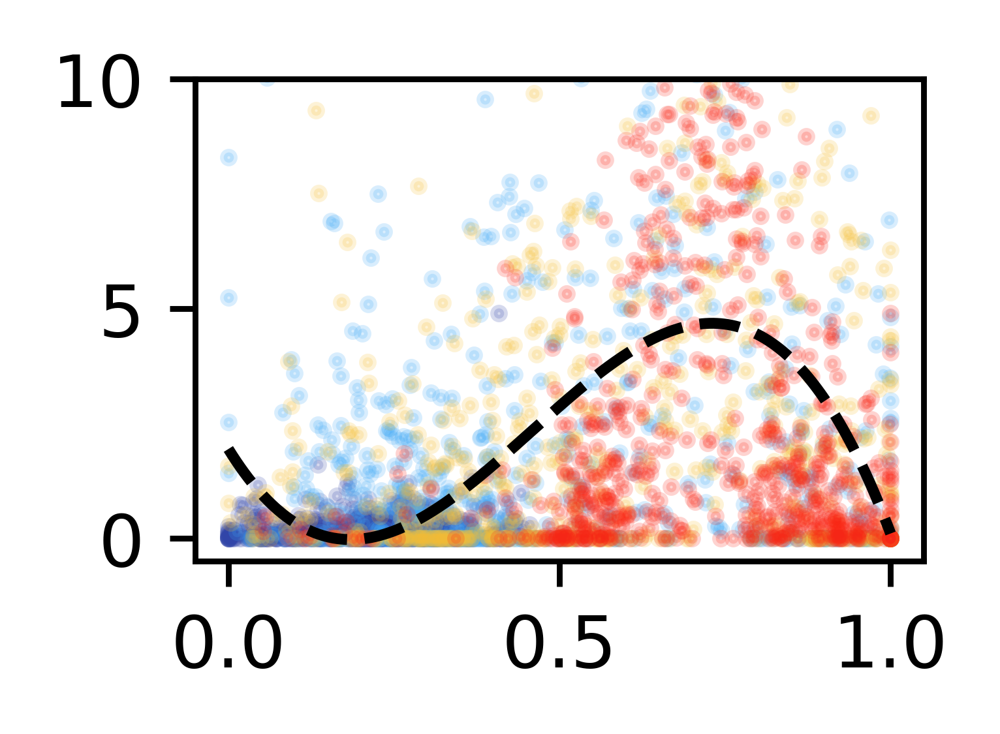

In [112]:
plt.figure(figsize=(1.8,1.2),dpi=800)
from scipy.optimize import curve_fit
hex_colors = ['#3145a8', '#40a8f7', '#f5bf36','#fa2616']

gene_name = list(np.intersect1d(all_new_data.var_names,wnt_signaling))
for i,j in enumerate(np.array([0,1,2,3]).astype(str)):
    plt.scatter(all_new_data[all_new_data.obs['weights'] == j].obs['Pseudotime'],
                all_new_data[all_new_data.obs['weights'] == j].to_df().loc[:, gene_name].mean(axis=1),
                color=hex_colors[i],
                s=2,
                alpha=0.2
               )
all_new_data_df = pd.DataFrame({
    'Pseudotime': all_new_data.obs['Pseudotime'],
    'wnt':np.array(all_new_data.to_df().loc[:, gene_name].mean(axis=1))
})


# Define a function for curve fitting, e.g., a polynomial of 3rd degree
def poly3(x, a, b, c, d):
    return a * x**3 + b * x**2 + c * x + d

# Fit the curve
popt, pcov = curve_fit(poly3, all_new_data_df['Pseudotime'], all_new_data_df['wnt'])

# Generate x values for the fitted curve
x_fit = np.linspace(0, 1, 2000)
y_fit = poly3(x_fit, *popt)


# Plot the fitted curve
plt.plot(x_fit, y_fit, color='black', linestyle='--', linewidth=1.5)
plt.ylim([-0.5,10])
plt.show()

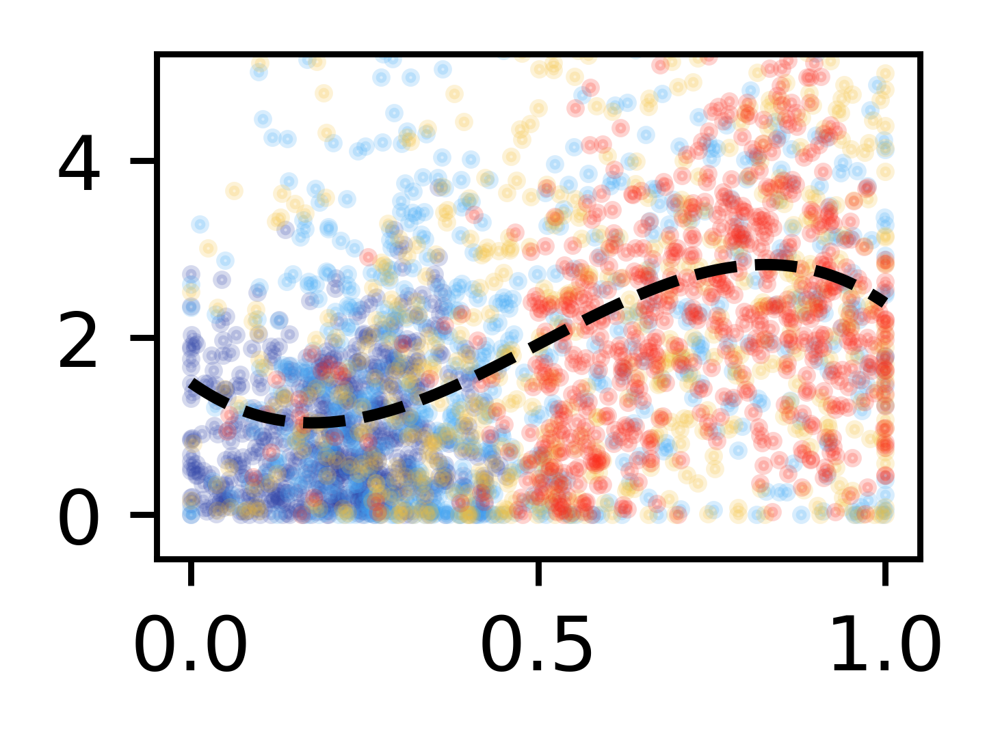

In [113]:
plt.figure(figsize=(1.8,1.2),dpi=800)
from scipy.optimize import curve_fit
hex_colors = ['#3145a8', '#40a8f7', '#f5bf36','#fa2616']

gene_name = list(np.intersect1d(all_new_data.var_names,BMP_signaling))
for i,j in enumerate(np.array([0,1,2,3]).astype(str)):
    plt.scatter(all_new_data[all_new_data.obs['weights'] == j].obs['Pseudotime'],
                all_new_data[all_new_data.obs['weights'] == j].to_df().loc[:, gene_name].mean(axis=1),
                color=hex_colors[i],
                s=2,
                alpha=0.2
               )
all_new_data_df = pd.DataFrame({
    'Pseudotime': all_new_data.obs['Pseudotime'],
    'wnt':np.array(all_new_data.to_df().loc[:, gene_name].mean(axis=1))
})


# Define a function for curve fitting, e.g., a polynomial of 3rd degree
def poly3(x, a, b, c, d):
    return a * x**3 + b * x**2 + c * x + d

# Fit the curve
popt, pcov = curve_fit(poly3, all_new_data_df['Pseudotime'], all_new_data_df['wnt'])

# Generate x values for the fitted curve
x_fit = np.linspace(0, 1, 2000)
y_fit = poly3(x_fit, *popt)


# Plot the fitted curve
plt.plot(x_fit, y_fit, color='black', linestyle='--', linewidth=1.5)
plt.ylim([-0.5,5.2])
plt.show()

In [114]:
all_new_data.obs['T'] = all_new_data[:,'T'].to_df()

/tmp/ipykernel_339955/390487437.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=all_new_data.obs, x='weights', y='T', ax=ax, whis=(0, 100), palette=['#3145a8', '#40a8f7', '#f5bf36', '#fa2616'])


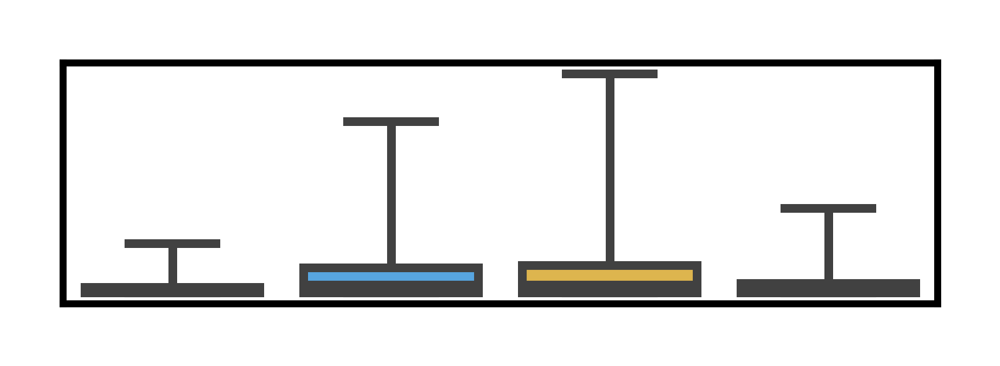

In [115]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure and axis
fig, ax = plt.subplots(1, 1, figsize=(1.8, 0.5), dpi=800)

# Create a boxplot with seaborn
sns.boxplot(data=all_new_data.obs, x='weights', y='T', ax=ax, whis=(0, 100), palette=['#3145a8', '#40a8f7', '#f5bf36', '#fa2616'])
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])
# Show the plot
plt.show()

                 sum_sq      df          F        PR(>F)
C(weights)   160.785460     3.0  91.235343  6.619201e-56
Residual    1407.502655  2396.0        NaN           NaN


/tmp/ipykernel_339955/1269462002.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p_value = anova_table['PR(>F)'][0]
/tmp/ipykernel_339955/1269462002.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x='weights', y='T', ax=ax, whis=(0, 100), palette=['#3145a8', '#40a8f7', '#f5bf36', '#fa2616'])


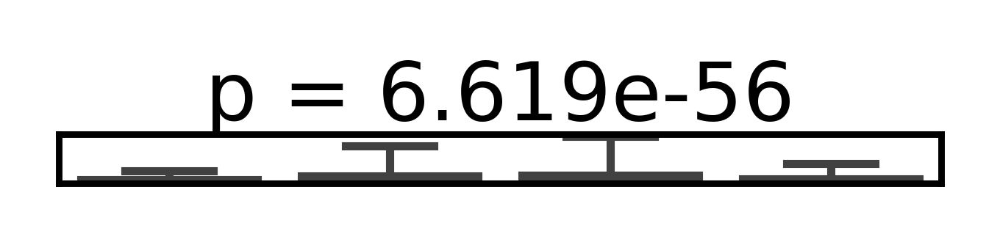

In [116]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Example DataFrame (replace with your actual data)
data = all_new_data.obs

# Perform ANOVA
model = ols('T ~ C(weights)', data=data).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
p_value = anova_table['PR(>F)'][0]
print(anova_table)

# Create a figure and axis
fig, ax = plt.subplots(1, 1, figsize=(1.8, 0.5), dpi=800)

# Create a boxplot with seaborn
sns.boxplot(data=data, x='weights', y='T', ax=ax, whis=(0, 100), palette=['#3145a8', '#40a8f7', '#f5bf36', '#fa2616'])
plt.xlabel('')
plt.ylabel('')
plt.xticks([])
plt.yticks([])

# Annotate the plot with the p-value
max_y = data['T'].max()
ax.text(1.5, max_y, f'p = {p_value:.3e}', ha='center', va='bottom', color='black')

# Show the plot
plt.tight_layout()
plt.show()


In [141]:
sc.tl.dpt(adata_squidiff) 

    adata.uns['iroot'] = root_cell_index
    adata.var['xroot'] = adata[root_cell_name, :].X


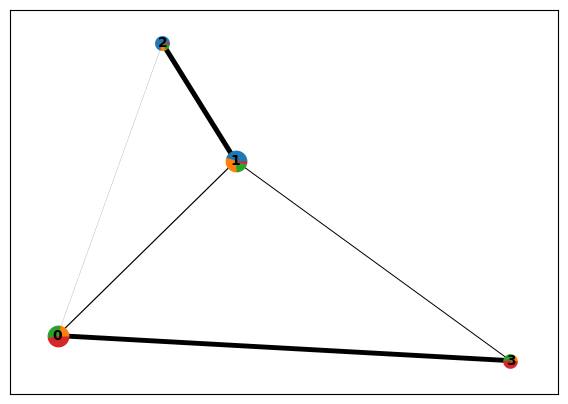

    adata.uns['iroot'] = root_cell_index
    adata.var['xroot'] = adata[root_cell_name, :].X


KeyError: 'dpt_pseudotime'

In [140]:

adata_squidiff = all_new_data.copy()

sc.tl.pca(adata_squidiff)  # Perform PCA
sc.pp.neighbors(adata_squidiff)  # Compute the neighborhood graph
sc.tl.leiden(adata_squidiff,resolution=0.5)
sc.tl.paga(adata_squidiff)  # Run PAGA
sc.pl.paga(adata_squidiff, color='weights')  # Plot PAGA based on experimental conditions

# Infer pseudotime with PAGA
sc.tl.dpt(adata_squidiff)  # Diffusion pseudotime based on PAGA
adata_squidiff.obs['pseudotime_paga'] = adata_squidiff.obs['dpt_pseudotime']


In [125]:
from scipy.stats import pearsonr
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean


def calculate_correlations(df, methods):
    correlations = {}
    for method in methods:
        correlations[method] = pearsonr(df['Squidiff'], df[method])[0]
    return correlations

def calculate_dtw_distances(df, methods):
    dtw_distances = {}
    for method in methods:
        # Reshape each series to be 2D with a single column
        squidiff_values = df['Squidiff'].values.reshape(-1, 1)  # Shape as (n, 1)
        method_values = df[method].values.reshape(-1, 1)  # Shape as (n, 1)
        
        # Calculate DTW distance using fastdtw with Euclidean distance metric
        distance, _ = fastdtw(squidiff_values, method_values, dist=euclidean)
        dtw_distances[method] = distance
    return dtw_distances

data = {
    'Squidiff': np.linspace(0, 1, 100),  # Replace with your actual Squidiff pseudotime values
    'Monocle': np.random.normal(0.5, 0.1, 100),  # Replace with actual pseudotime values for Monocle
    'Slingshot': np.random.normal(0.5, 0.1, 100),  # Replace with actual pseudotime values for Slingshot
    'PAGA': np.random.normal(0.5, 0.1, 100)  # Replace with actual pseudotime values for PAGA
}

pseudotime_df = pd.DataFrame(data)
methods = ['Monocle', 'Slingshot', 'PAGA']

correlations = calculate_correlations(pseudotime_df, methods)
dtw_distances = calculate_dtw_distances(pseudotime_df, methods)


In [126]:



print("Pseudotime Correlations:", correlations)
print("DTW Distances:", dtw_distances)


Pseudotime Correlations: {'Monocle': 0.009402600738549358, 'Slingshot': 0.009420707565216553, 'PAGA': -0.0372942261677698}
DTW Distances: {'Monocle': 20.80592243041977, 'Slingshot': 24.024008839570698, 'PAGA': 24.45885743830623}


In [13]:

z_sem = model.encoder(torch.tensor(data[2].X).to('cuda'))

x_T = stochastic_encode(model,
                        x = torch.tensor(data[2].X, dtype = torch.float32).to('cuda'),
                        t = 999,
                        model_kwargs={'x_start':torch.tensor(data[2].X).to('cuda'),
                                      'z_mod':z_sem}
                       )['sample']


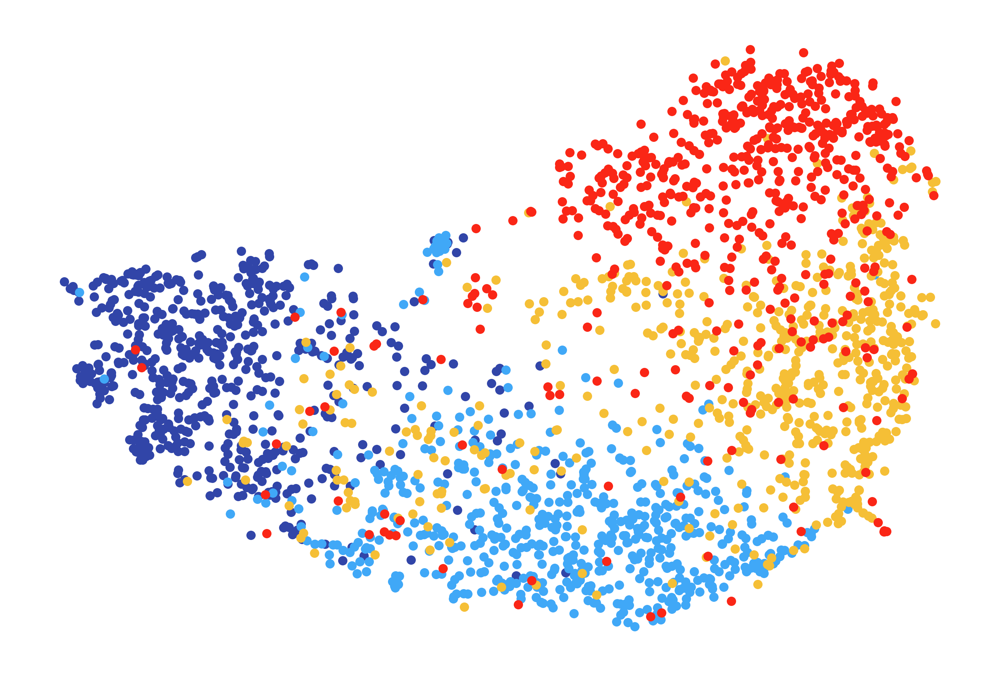

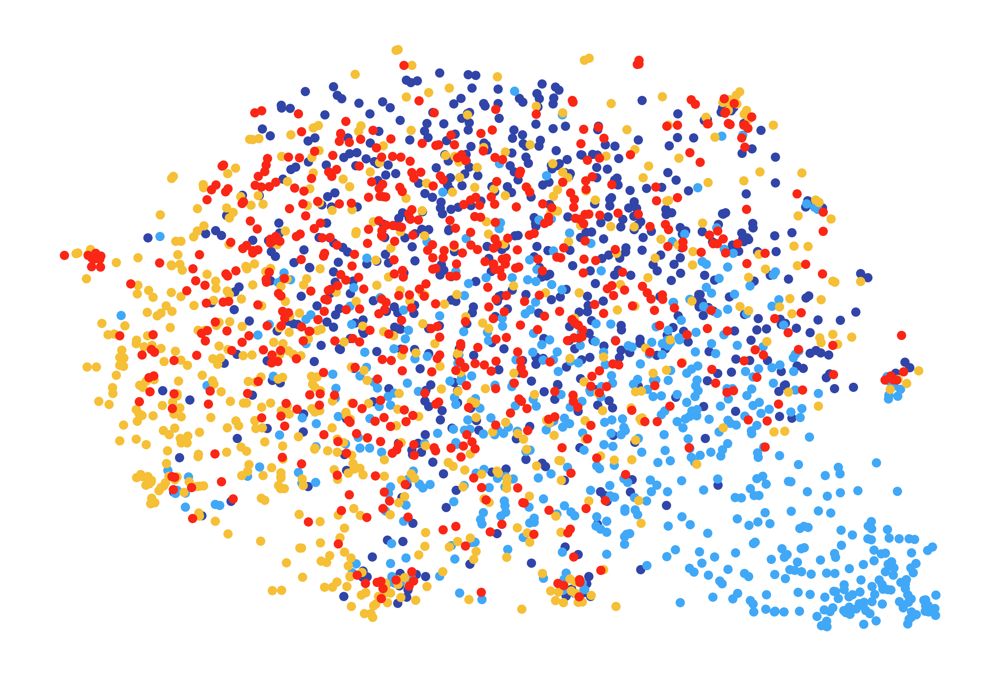

In [14]:
import umap
from sklearn.decomposition import PCA
#pca = PCA(n_components=50)
#z_sem_pca = pca.fit_transform(z_sem.detach().cpu())

reducer = umap.UMAP(n_neighbors=30, min_dist=0.01, n_components=2)
embedding = reducer.fit_transform(z_sem.detach().cpu())


import matplotlib.pyplot as plt
plt.figure(figsize=(6,4),dpi=600)
colorlist =  ['#3145a8', '#40a8f7', '#f5bf36','#fa2616']
for i in range(4):
    scatter = plt.scatter(embedding[data[2].obs['day'].values==i, 0], 
                          embedding[data[2].obs['day'].values==i, 1], 
                          c= colorlist[i],
                          s=5,
                          alpha=1)
#plt.colorbar(scatter, label='Day')
#plt.title('UMAP projection of z_sem embeddings')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.axis('off')
plt.show()

reducer = umap.UMAP(n_neighbors=30, min_dist=0.02, n_components=2)
embedding = reducer.fit_transform(x_T.detach().cpu())


import matplotlib.pyplot as plt
plt.figure(figsize=(6,4),dpi=600)
colorlist =  ['#3145a8', '#40a8f7', '#f5bf36','#fa2616']
for i in range(4):
    scatter = plt.scatter(embedding[data[2].obs['day'].values==i, 0], 
                      embedding[data[2].obs['day'].values==i, 1], 
                      c= colorlist[i],
                      s=5,
                      alpha=1)
#plt.colorbar(scatter, label='Day')
#plt.title('UMAP projection of z_sem embeddings')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.axis('off')
plt.show()